<h1 align="center">Quantifying Greenhushing & Exploring its Relationship with Excess Executive Compensation</h1>

# 1. Introduction

In concordance with the rising importance of *Environmental, Social and Governance* `(ESG)` in the modern operational aspect of a business, this study investigates the intricate and dynamic relationship between excess executive compensation and ***“greenhushing”*** -  a term coined by “TreeHugger” back in 2008, to describe the purposeful concealment or underreporting of environmental performance or consequences by firms. It is typified by deliberate attempts of firms to omit environmental metrics, under-representing sustainable projects, or deflecting attention from environmental initiatives. 

This obscuring of the green initiatives stems from a firm’s fear of being accused of greenwashing, hypocrisy or facing negative attention if it falls short in their environmental efforts and climate strategies. According to `Eco-Business` (2022), Increased scrutiny by the media, NGOs, the public, and consumer and market authorities has made companies more wary about communicating their targets, leading to a concerning trend of less public-facing communication and limited knowledge-sharing. As a result of that stigma, a report by `South Pole` (2022) found that nearly one in four large, private companies from various sectors have set net-zero targets but have chosen not to publicize their progress, proving the existence of greenhushing.

The fundamental question at the heart of this investigation is ***“Is greenhushing a panacea or a smokescreen for the issue of excessive executive compensation within corporate entities?”*** 

This question encapsulates a multifaceted exploration into the mechanisms through which greenhushing interacts with and potentially incentivize or disincentivize the increase in CEO compensation packages, serving as a proxy for executive excess compensation. Using sophisticated regression models and leveraging cutting edge **Natural Language Processing** techniques such as *Latent Dirichlet Allocation* `(LDA)` for topic modeling, *Continuous Bag of Words* `(CBOW)` via **Word2Vec** model for topic embedding, *Word Frequency Distribution* `(FreqDist)`, and *Term Frequency-Inverse Document Frequency* `(TF-IDF)` Vectorization for keyword extraction, along with a quantitative statistical analysis and methodical data extraction from public documents using web and document scraping methods, this work intends to shed light on the intricate interplay between executive remuneration packages and the narratives surrounding corporate sustainability initiatives and disclosure.

The significance of this research extends beyond academic inquiry to directly impact businesses in today's dynamic and interconnected global landscape. Understanding and addressing the pervasive phenomenon of greenhushing within corporate sustainability practices is paramount for businesses striving to uphold integrity, credibility, and long-term viability in the eyes of stakeholders. As emphasized by `Compliance Week` (2022), the alignment between corporate actions and stakeholder expectations, including investors, employees, and customers, is foundational to building and maintaining trust in business operations. Failure to transparently communicate ESG goals and performance can erode this trust, leading to reputational damage and diminished stakeholder confidence, with far-reaching implications for business sustainability and competitiveness.
Additionally, The detrimental impact of excessive executive compensation on both corporations and the broader economy is a topic of concern to this paper. As highlighted by the `Economic Policy Institute` (EPI) in 2019, CEO compensation packages exhibit a rapid upward trend relative to the wages of typical workers. The implications of this phenomenon, according to EPI, are far-reaching. Firstly, it exacerbates income inequality within corporations and the broader economy. In addition, excessive CEO compensation permeates corporate pay structures, influencing wage distributions throughout the organization. A reduction in CEO pay could potentially lead to more equitable compensation among other executives and, by extension, foster a fairer and more sustainable corporate environment and overall a more room for shareholder returns.

Moreover, the interplay between greenhushing and executive compensation presents a critical juncture where corporate governance, accountability, and financial stewardship converge. Executives who leverage greenhushing to obscure sustainability shortcomings may inadvertently perpetuate a culture of opacity and misalignment with stakeholder interests out of fear of reputational risk. This potential deterioration of their reputation can have cascading effects on executive compensation practices, potentially incentivizing excessive pay packages that are not commensurate with genuine ESG performance but rather as a mechanism to mitigate such a career risk. 

Ultimately, the objective of this research is to significantly broaden our knowledge of corporate governance, sustainability reporting, and executive compensation from a scholarly and practical standpoint. Firstly, this study will pioneer the development of a novel numerical measure for greenhushing, providing a quantitative framework for assessing the extent and impact of greenhushing behaviors within corporate sustainability initiatives and reporting. This work seeks to contribute to the development of methodological approaches for detecting and mitigating instances of greenhushing and sustainability-related misconduct within corporate reporting. By leveraging cutting-edge techniques in data extraction, analysis, and machine learning, we aim to identify hidden patterns and signals that may indicate potential instances of deception or misrepresentation, thereby enhancing the transparency and reliability of sustainability disclosures. 

Secondly, this study is expected to offer insights into the mechanisms through which executive compensation packages may influence corporate sustainability practices and vice versa, either by incentivizing genuine commitment to environmental stewardship or by inadvertently fostering underreporting behaviors. This understanding has profound implications for corporate governance practices, as well as for the design of executive compensation schemes that align with long-term sustainability objectives, promoting transparency whilst protecting executives from the potential reputational risk related to it. 

From a practical standpoint, the findings are expected to offer valuable insights for investors, regulators, and corporate stakeholders seeking to navigate the increasingly complex landscape of ESG investing, and sustainable finance. By providing empirical evidence and actionable insights into the relationship between executive compensation, greenhushing, and corporate sustainability practices, we aim to equip decision-makers with the knowledge and tools necessary to make informed investment decisions, drive organizational change, and foster greater accountability and transparency in corporate reporting.


In [1]:
# Standard library imports
import os
import re
import time
import warnings
from pprint import pprint
from datetime import datetime
from dateutil.relativedelta import relativedelta

# Third-party library imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm
from scipy import stats
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.stattools import durbin_watson
from linearmodels.panel import PanelOLS, compare,RandomEffects, PooledOLS
from gensim import corpora, models
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import requests
from bs4 import BeautifulSoup
import tabula
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.common.exceptions import TimeoutException, NoSuchElementException
from IPython.display import display
import gensim.downloader as api
import ast
from nltk.probability import FreqDist
from sklearn.feature_extraction.text import TfidfVectorizer

api.download("word2vec-google-news-300")
w2v_model = api.load("word2vec-google-news-300")

warnings.simplefilter(action='ignore', category=FutureWarning)

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

start = 2017
end = 2021

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# 2. Data Extraction, Preprocessing & Feature Engineering

We obtain data on S&P 500 firms from multiple sources, covering the period from 2017 to 2021. This timeframe is particularly significant as sustainability reporting among these firms surpassed 85% in 2017, marking a critical point in environmental transparency within the corporate sector. However, the availability of parsed Carbon Disclosure Project data sets the limit on the sample to 2021 but still enables for a comprehensive analysis of greenhushing practices.
<div style="text-align:center">
    <img src="ESG Reporters.png" alt="alt text" title="image title" width="600" height="400" />
</div>

## 2.1. Collecting General S&P 500 Data 

We began the construction of our dataset by first gathering essential information on S&P 500 firms using web scraping techniques. This process involved obtaining tickers, company names, CIK codes, and GICS Sector and Sub-Industry, which provided a comprehensive overview of the companies within our sample.

### 2.1.1. Data Scraping

In [2]:
def get_snp500_info():
    url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
    response = requests.get(url)
    if response.status_code == 200:
        soup = BeautifulSoup(response.content, 'html.parser')
        table = soup.find('table', {'class': 'wikitable sortable'})
        companies_info = []
        for row in table.find_all('tr')[1:]:
            columns = row.find_all('td')
            if len(columns) > 0:
                ticker_symbol = columns[0].text.strip() 
                company_name = columns[1].text.strip()  
                cik_code = columns[6].text.strip()  
                gics_sub = columns[3].text.strip()
                gics = columns[2].text.strip()
                companies_info.append((ticker_symbol, company_name, cik_code, gics, gics_sub))
        return companies_info
    else:
        print("Failed to retrieve data from Wikipedia.")
        return None

In [3]:
snp500_info = get_snp500_info()
if snp500_info:
    SP500 = pd.DataFrame(snp500_info, columns=['Ticker Symbol', 'Company Name', 'CIK Code','GICS Sector', 'Industry'])

### 2.1.2. Exploring the Data

In [4]:
SP500.head(30)

,Ticker Symbol,Company Name,CIK Code,GICS Sector,Industry
0,MMM,3M,0000066740,Industrials,Industrial Conglomerates
1,AOS,A. O. Smith,0000091142,Industrials,Building Products
2,ABT,Abbott,0000001800,Health Care,Health Care Equipment
3,ABBV,AbbVie,0001551152,Health Care,Biotechnology
4,ACN,Accenture,0001467373,Information Technology,IT Consulting & Other Services
5,ADBE,Adobe Inc.,0000796343,Information Technology,Application Software
6,AMD,Advanced Micro Devices,0000002488,Information Technology,Semiconductors
7,AES,AES Corporation,0000874761,Utilities,Independent Power Producers & Energy Traders
8,AFL,Aflac,0000004977,Financials,Life & Health Insurance
9,A,Agilent Technologies,0001090872,Health Care,Life Sciences Tools & Services


In [5]:
SP500.describe()[:2]

,Ticker Symbol,Company Name,CIK Code,GICS Sector,Industry
count,503,503,503,503,503
unique,503,503,500,11,127


In [6]:
fig = px.histogram(SP500, x='GICS Sector',  
                   title="S&P 500 Companies' Distribution per GICS Sector",
                   )

# Customize the layout
fig.update_layout(
    xaxis_title='GICS Sector',
    yaxis_title='Number of Companies',
    bargap=0.1,  # Adjust the gap between bars
    width=1300,   # Set the width of the plot
    height=600   # Set the height of the plot
)

# Show the plot
fig.show()


## 2.2. Collecting Data for Greenhushing Measuring

### 2.2.1. Extracting CDP Questionnaire Answers' Data

To measure greenhushing, we utilized responses to the CDP Questionnaire, focusing on questions related to green efforts of S&P 500 companies from 2017 to 2021. The data collection process was meticulously optimized. The CDP data was stored in Excel files, with each year in a separate file. Opening a file entirely took about 7 to 8 minutes, but by accessing specific sheets containing the targeted questions and handling sheet name discrepancies through a recursive approach in Python triggered by exception handling, we reduced the data fetching duration to 6 minutes and 34 seconds for all files combined.

The targeted CDP questions  covered a broad spectrum of environmental topics including climate change governance, risk management, strategy, and emissions targets and sought to focus on companies’ green initiatives in financial planning, strategy, and supplier engagement, detailing emissions reduction initiatives, investment methods as well as environmental risk management methods. The collected data facilitated an assessment of greenhushing by comparing disclosed topics against industry-relevant topics and metrics from the Sustainability Accounting Standards Board standards  and analyzing linguistic patterns and word choices in the disclosures , drawing inspiration from Font et al. (2016). Upon exploring the gathered CDP data, we noticed a significant decrease in the company that do not respond to CDP questionnaire throughout the years. Also, the number of companies with bad environmental performance, proxied by the number of firms whose boards do not investigate environmental problems or do not have a process to assess and mitigate climate risk, is hovering between 7 and 13 companies across years.

#### 2.2.1.1. Data Loading

In [7]:
Questions = {
    1: 
    {
        "C1 - Governance": [
            'Describe where in the organizational structure this/these position(s) and/or committees lie, what their associated responsibilities are, and how climate-related issues are monitored (do not include the names of individuals).'
        ],
        'C1.1a': [
            'Identify the position(s) (do not include any names) of the individual(s) on the board with responsibility for climate-related issues. - Please explain'
        ],
        'C1.3': [
            'Do you provide incentives for the management of climate-related issues, including the attainment of targets? - Comment'
        ],
        'C1.3a': [
            'Provide further details on the incentives provided for the management of climate-related issues  (do not include the names of individuals). - Comment'
        ],
        'C2.2': [
            'Describe your process(es) for identifying, assessing and responding to climate-related risks and opportunities. - Description of process'
        ],
        'C2.4a': [
            'Provide details of opportunities identified with the potential to have a substantive financial or strategic impact on your business. - Strategy to realize opportunity and explanation of cost calculation'
        ],
        'C3.1e': [
            'Describe where and how climate-related risks and opportunities have influenced your financial planning. - Description of influence'
        ],
        'C3.2a': [
            'Provide details of your organization’s use of climate-related scenario analysis. - Details'
        ],
        'C3.3': [
            'Describe where and how climate-related risks and opportunities have influenced your strategy. - Description of influence'
        ],
        'C12.1a': [
            'Provide details of your climate-related supplier engagement strategy. - Rationale for the coverage of your engagement',
            'Provide details of your climate-related supplier engagement strategy. - Impact of engagement, including measures of success',
            'Provide details of your climate-related supplier engagement strategy. - Comment'
        ],
        'C4.1a': [
            'Provide details of your absolute emissions target(s) and progress made against those targets. - Please explain (including target coverage)'
        ],
        'C4.1b': [
            'Provide details of your emissions intensity target(s) and progress made against those target(s). - Please explain (including target coverage)'
        ],
        'C4.2a': [
            'Provide details of your target(s) to increase low-carbon energy consumption or production. - Please explain  (including target coverage)'
        ],
        'C4.2c': [
            'Provide details of your net-zero target(s). - Please explain (including target coverage)'
        ],
        'C4.3b': [
            'Provide details on the initiatives implemented in the reporting year in the table below. - Comment'
        ],
        'C4.3c': [
            'What methods do you use to drive investment in emissions reduction activities? - Comment'
        ],
        'C4.5a': [
            'Provide details of your products and/or services that you classify as low-carbon products or that enable a third party to avoid GHG emissions. - Comment'
        ]
    },
    0:
    {
        'CC1.2a': [
            'Please provide further details on the incentives provided for the management of climate change issues - Comment'
        ],
        'CC2.1a': [
            'Please provide further details on your risk management procedures with regard to climate change risks and opportunities - Comment'
        ],
        'CC2.3a': [
            'On what issues have you been engaging directly with policy makers? - Details of engagement'
        ],
        'CC3.1a': [
            'Please provide details of your absolute target - Comment'
        ],
        'CC3.1b': [
            'Please provide details of your intensity target - Comment'
        ],
        'CC3.1c': [
            'Please also indicate what change in absolute emissions this intensity target reflects - Comment'
        ],
        'CC3.1d': [
            'Please provide details of your renewable energy consumption and/or production target - Comment'
        ],
        'CC3.2a': [
            'Please provide details of your products and/or services that you classify as low carbon products or that enable a third party to avoid GHG emissions - Comment'
        ],
        'CC3.3b': [
            'For those initiatives implemented in the reporting year, please provide details in the table below - Comment'
        ],
        'CC3.3c': [
            'What methods do you use to drive investment in emissions reduction activities? - Comment'
        ],
        'CC5.1a': [
            'Please describe your inherent risks that are driven by changes in regulation - Management method'
        ],
        'CC5.1b': [
            'Please describe your inherent risks that are driven by changes in physical climate parameters - Management method'
        ],
        'CC5.1c': [
            'Please describe your inherent risks that are driven by changes in other climate-related developments - Management method'
        ],
        'CC6.1a': [
            'Please describe your inherent opportunities that are driven by changes in regulation - Management method'
        ],
        'CC6.1b': [
            'Please describe your inherent opportunities that are driven by changes in physical climate parameters - Management method'
        ],
        'CC6.1c': [
            'Please describe your inherent opportunities that are driven by changes in other climate-related developments - Management method'
        ]
    }
}

In [8]:
Bad_Performance_Questions = {
    1:
        {'C1.1c':'Why is there no board-level oversight of climate-related issues and what are your plans to change this in the future? - Please explain',
        'C2.2g':'Why does your organization not have a process in place for identifying, assessing, and responding to climate-related risks and opportunities, and do you plan to introduce such a process in the future? - Please explain',
        'C2.2e':'Why does your organization not have a process in place for identifying, assessing, and responding to climate-related risks and opportunities, and do you plan to introduce such a process in the future? - Please explain'},
    0:
        {'CC2. Strategy SME':'Please explain why climate change is not integrated into your business strategy',
        'CC2.1d':'Please explain why you do not have a process in place for assessing and managing risks and opportunities from climate change, and whether you plan to introduce such a process in future - Comment'}
    }

In [9]:
def data_fetcher(file_path, questions_dict):
    
    try:
        return pd.read_excel(file_path, sheet_name=list(questions_dict.keys()))
        
    except ValueError as v:
        pattern = r"'(.*?)'"
        sheet = re.findall(pattern, str(v))[0]
        del questions_dict[sheet]
        
        return data_fetcher(file_path, questions_dict)

In [10]:
cdp_data = {} 
environmental_perf_data = {}
Years = range(start, end+1)
print("CDP Data Loading...\n")
for year in Years:
    print('Loading CDP Data for Year:',year)    
    file_path = f'CDP Data\\{year} Public Climate Change Data.xlsx'
    cdp_data[year] = data_fetcher(file_path, Questions[year >= 2018].copy())
    environmental_perf_data[year] = data_fetcher(file_path, Bad_Performance_Questions[year >= 2018].copy())
    print(f'{year} Data: Loaded Successfully\n')
print("CDP Data Loaded Successfully.")

CDP Data Loading...

Loading CDP Data for Year: 2017
2017 Data: Loaded Successfully

Loading CDP Data for Year: 2018
2018 Data: Loaded Successfully

Loading CDP Data for Year: 2019
2019 Data: Loaded Successfully

Loading CDP Data for Year: 2020
2020 Data: Loaded Successfully

Loading CDP Data for Year: 2021
2021 Data: Loaded Successfully

CDP Data Loaded Successfully.


#### 2.2.1.2. Preprocessing & Feature Engineering

In [11]:
def remove_before_last_underscore_in_columns(df,year):
    
    def remove_before_last_underscore(column_name):
        last_underscore_index = column_name.rfind('_')
        if last_underscore_index != -1:
            return column_name[last_underscore_index + 1 :]
        else:
            return column_name
        
    def remove_preffix(text):
        # Check if the string starts with 'CC'
        if text.startswith('CC'):
            # Find the index of the first occurrence of ' - '
            index = text.find(' - ')
            if index != -1:
                # Extract the substring before ' - ' (including ' - ')
                result = text[index+2:]
            else:
                # If ' - ' is not found, return the input text
                result = text
        else:
            # If the string does not start with 'CC', return the input text
            result = text
        
        # Strip any leading or trailing whitespace
        result = result.strip()
        
        return result
    if year >= 2018:
        new_column_names = [remove_before_last_underscore(col) for col in df.columns]
    else : 
        new_column_names = [remove_preffix(col) for col in df.columns]
    df.columns = new_column_names

    return df

In [12]:
def concatenate_string_columns(df):

    df_copy = df.copy()
    string_columns = [col for col in df_copy.columns if col != 'Tickers' and df_copy[col].dtype == 'object']
    df_copy['CPD Text Data'] = df_copy[string_columns].apply(lambda row: '\n'.join(row.dropna()), axis=1)
    df_copy.drop(string_columns, axis=1, inplace=True)

    return df_copy

In [13]:
def split_into_paragraphs(text):
    
    sentences_per_paragraph = 3
    if isinstance(text, str):
        sentences = nltk.sent_tokenize(text)
        if len(sentences)> 2*sentences_per_paragraph:
            paragraphs = []
            current_paragraph = ""

            for idx, sentence in enumerate(sentences):
                if idx % sentences_per_paragraph == 0 and idx != 0:
                    paragraphs.append(current_paragraph)
                    current_paragraph = ""
                current_paragraph += sentence + " "

            if current_paragraph.strip():
                paragraphs.append(current_paragraph.strip())
            return '\n'.join(paragraphs)
    return text

In [14]:
def treat(Str):
    if Str[0]==' ':
        Str = Str[1:]
    if ',' in Str:
        Str = Str.split(',')[0]
        if ' ' in Str:
            return Str[0:-3]
        else:
            return Str
    if '/' in Str:
        Str = Str.replace('/','.')
    if Str[0:-3]=='WYN':
        return 'WYNN'
    return Str[0:-3]

In [15]:
def concatenate_str(values):
    return '\n'.join(str(v) for v in values.unique() if str(v)!='nan')

In [16]:
def update_bad_performance_column(df,year):
    for i, column_name in enumerate(Bad_Performance_Questions[year >= 2018].values()):
        df.loc[:,f'Binary{i}'] = 0
        if column_name in df.columns:
            mask = df[column_name].apply(lambda value: 'Question not applicable' in str(value) or 'nan' in str(value))
            df.loc[:,f'Binary{i}'] = 1 - mask.astype(int)

    bad_performance_cols = [col for col in df.columns if col.startswith('Binary')]

    df['Bad Performance'] = df[bad_performance_cols].max(axis=1)
    df.drop(columns=bad_performance_cols, inplace=True)

    return df

In [17]:
CDP_Data_Historical = {}
Bad_Performance_Historical = {}
Undisclosed = {}
Merged_CDP_Data = {}

Tic = {0:'ticker',1:'Tickers'}
US = {0:'USA',1:'United States of America'}
Country = {0:'incorporated_country',1:'Country'}

for year in Years: 
    
    cdp_filtered_data = {}
    e_perf_filtered_data = {}
    tic = Tic[year >= 2018]
    us = US[year >= 2018]
    country = Country[year >= 2018]
    # Filtering CDP question answers
    for sheet_name, df in cdp_data[year].items():
        
        df = remove_before_last_underscore_in_columns(df,year)
        df.dropna(subset=[tic],inplace=True)
        filtered_df = df.loc[df[country] == us,df.columns] 
        filtered_df[tic] = filtered_df[tic].apply(treat)
        filtered_df = filtered_df.loc[filtered_df[tic].isin(SP500['Ticker Symbol'])]
        if sheet_name in cdp_data[year].keys():
            for col in Questions[year >= 2018][sheet_name]:
                if col in filtered_df.columns:
                    filtered_df[col] = filtered_df[col].apply(split_into_paragraphs)
        filtered_df.rename(columns={'ticker':'Tickers'},inplace=True)
        cols = ['Tickers']
        if sheet_name in Questions[year >= 2018].keys():
            cols += [q for q in Questions[year >= 2018][sheet_name] if q in filtered_df.columns]
        
        if len(cols)>1:       
            cdp_filtered_data[sheet_name] = filtered_df[cols].groupby('Tickers').agg({col: concatenate_str for col in cols if col != 'Tickers'}).reset_index()

    cdp_dfs = list(cdp_filtered_data.values())

    cdp_merged_df = cdp_dfs[0]
    for df in cdp_dfs[1:]:
        cdp_merged_df = pd.merge(cdp_merged_df, df, on='Tickers', how='outer')

    CDP_Data_Historical[year] = concatenate_string_columns(cdp_merged_df)

    # Filtering answers on "bad environmental performance" focused questions
    for sheet_name, df in environmental_perf_data[year].items():
        
        df = remove_before_last_underscore_in_columns(df,year)
        df.dropna(subset=[tic],inplace=True)
        filtered_df = df.loc[df[country] == us,df.columns] 
        filtered_df[tic] = filtered_df[tic].apply(treat)
        filtered_df = filtered_df.loc[filtered_df[tic].isin(SP500['Ticker Symbol'])]
        filtered_df.rename(columns={'ticker':'Tickers'},inplace=True)    
        cols = ['Tickers']
        if sheet_name in Bad_Performance_Questions[year >= 2018].keys():
            if Bad_Performance_Questions[year >= 2018][sheet_name] in filtered_df.columns:
                cols.append(Bad_Performance_Questions[year >= 2018][sheet_name]) 
        if len(cols)>1:       
            e_perf_filtered_data[sheet_name] = filtered_df[cols]

    e_perf_dfs = list(e_perf_filtered_data.values())
    if len(e_perf_dfs)>1:
        e_perf_merged_df = e_perf_dfs[0]
        for df in e_perf_dfs[1:]:
            Bad_Performance_Historical[year] = update_bad_performance_column(pd.merge(e_perf_merged_df, df, on='Tickers', how='outer').copy(),year)[['Tickers','Bad Performance']]
    else:
        Bad_Performance_Historical[year] = update_bad_performance_column(e_perf_dfs[0].copy(),year)[['Tickers','Bad Performance']]

    # Filtering companies that did not CDP
    Undisclosed[year] = pd.DataFrame(data=list(set(SP500['Ticker Symbol']) - set(cdp_merged_df['Tickers'])), columns=['Tickers'])

    # Merging CDP Data
    merged_df = pd.concat([pd.merge(CDP_Data_Historical[year], Bad_Performance_Historical[year], on='Tickers', how='inner'), Undisclosed[year]],axis=0).sort_values('Tickers')
    merged_df['Bad Performance'] = merged_df['Bad Performance'].fillna(-1).astype(int)
    Merged_CDP_Data[year] = merged_df 

#### 2.2.1.3. Exploring the Data

In [18]:
for year in Years:
    print(f'Year: {year}')
    Merged_CDP_Data[year]['Year'] = year
    display(Merged_CDP_Data[year])

Year: 2017


,Tickers,CPD Text Data,Bad Performance,Year
0,A,Individual Performance Bonuses can be achieved...,0,2017
1,AAL,Key operational employees that can impact fuel...,0,2017
2,AAPL,Some companies directly link executive compens...,0,2017
3,ABBV,Performance goals are taken by VP of Health an...,0,2017
173,ABNB,NaN,-1,2017
...,...,...,...,...
257,XYL,"At Xylem, our goal is to operate in harmony wi...",0,2017
258,YUM,Setting and achieving sustainability goals whi...,0,2017
259,ZBH,\n\n\nWe are always researching and applying m...,1,2017
185,ZBRA,NaN,-1,2017


Year: 2018


,Tickers,CPD Text Data,Bad Performance,Year
0,A,Strategic suppliers and those with greatest en...,0,2018
1,AAL,American's Supplier Code of Conduct applies to...,0,2018
2,AAPL,"To do business with Apple, every supplier must...",0,2018
3,ABBV,Our method of engagement is to audit or to sen...,0,2018
169,ABNB,NaN,-1,2018
...,...,...,...,...
261,XYL,We expect 100 percent of our suppliers to adhe...,0,2018
262,YUM,Palm oil and timber are two key supplier group...,0,2018
263,ZBH,Question not applicable\nQuestion not applicab...,1,2018
180,ZBRA,NaN,-1,2018


Year: 2019


,Tickers,CPD Text Data,Bad Performance,Year
0,A,Agilent's Sustainability Committee has the Vic...,0,2019
1,AAL,This committee is made up of representatives f...,0,2019
2,AAPL,i. Lisa Jackson is Apple's Vice President of E...,0,2019
3,ABBV,The Executive Vice President of Operations has...,0,2019
152,ABNB,NaN,-1,2019
...,...,...,...,...
286,XYL,"At Xylem, we believe that if you can change wa...",0,2019
287,YUM,The Vice President of Global Citizenship and S...,0,2019
288,ZBH,i. Where in the organizational structure this ...,1,2019
163,ZBRA,NaN,-1,2019


Year: 2020


,Tickers,CPD Text Data,Bad Performance,Year
0,A,Agilent's Sustainability Committee has the Vic...,0,2020
1,AAL,"American's Corporate Affairs group, which is l...",0,2020
2,AAPL,i. Lisa Jackson is Apple's Vice President of E...,0,2020
3,ABBV,The Executive Vice President of Operations has...,0,2020
140,ABNB,NaN,-1,2020
...,...,...,...,...
303,XYL,Sustainability isn't just an initiative at Xyl...,0,2020
304,YUM,The Vice President of Global Government Affair...,0,2020
305,ZBH,i. Description of the responsibilities or the ...,0,2020
306,ZBRA,Question not applicable\nQuestion not applicab...,1,2020


Year: 2021


,Tickers,CPD Text Data,Bad Performance,Year
0,A,Agilent's Sustainability Committee has the Vic...,0,2021
1,AAL,"American's Corporate Affairs group, which is l...",0,2021
2,AAPL,i. Lisa Jackson is Apple's Vice President of E...,0,2021
3,ABBV,The Executive Vice President of Operations has...,0,2021
123,ABNB,NaN,-1,2021
...,...,...,...,...
325,XYL,Sustainability isn't just an initiative at Xyl...,0,2021
326,YUM,The Chief Sustainability Officer (CSO) is resp...,0,2021
327,ZBH,i. Description of the responsibilities or the ...,0,2021
328,ZBRA,We leverage our cross-functional Sustainabilit...,0,2021


In [19]:
CDP_Data = pd.concat(list(Merged_CDP_Data.values())).sort_values(['Tickers','Year'])
CDP_Data.head()

,Tickers,CPD Text Data,Bad Performance,Year
0,A,Individual Performance Bonuses can be achieved...,0,2017
0,A,Strategic suppliers and those with greatest en...,0,2018
0,A,Agilent's Sustainability Committee has the Vic...,0,2019
0,A,Agilent's Sustainability Committee has the Vic...,0,2020
0,A,Agilent's Sustainability Committee has the Vic...,0,2021


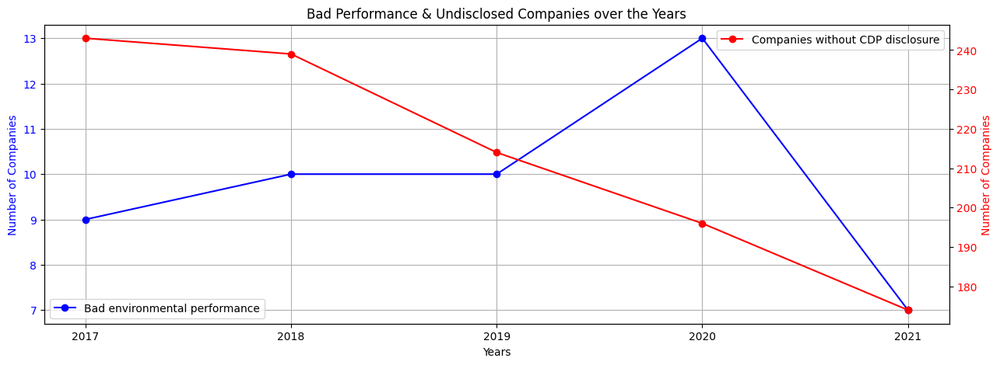

In [20]:
fig, ax1 = plt.subplots(figsize=(15, 5))

ax1.plot(Years, [(Merged_CDP_Data[year]['Bad Performance']==1).sum() for year in Years], marker='o', label='Bad environmental performance', color='b')
ax1.set_xlabel('Years')
ax1.set_ylabel('Number of Companies', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.legend(loc='lower left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(Years, [(Merged_CDP_Data[year]['Bad Performance']==-1).sum() for year in Years], marker='o', label='Companies without CDP disclosure', color='r')
ax2.set_ylabel('Number of Companies', color='r')
ax2.tick_params(axis='y', labelcolor='r')
ax2.legend(loc='upper right')

plt.xticks(Years) 
plt.title('Bad Performance & Undisclosed Companies over the Years')
plt.show()

### 2.2.2. Extracting Relevant Topics for each Industry According to SASB

Industry-relevant SASB topics and metrics were meticulously collected by scraping the SASB Standards PDF (“.pdf” extension) documents for each industry. These PDFs were manually collected to ensure the accuracy and relevance of the data. Each company was matched with its corresponding SASB Industrial Classification, obtained by scraping the SASB official website in section 2.2.4.
 
This classification enabled us to identify the specific SASB topics and metrics pertinent to each company in the sample. These topics encompass a broad range of sustainability issues tailored to the unique characteristics and requirements of each industry.

In [21]:
def shift_last_n_rows(df, n):
    """
    Shifts the last n rows of a DataFrame by one column to the right.

    Args:
        df (pd.DataFrame): The DataFrame to shift.
        n (int): Number of rows to shift.

    Returns:
        pd.DataFrame: The DataFrame with the last n rows shifted.
    """
    
    last_n_rows = df.tail(n)
    shifted_last_n_rows = last_n_rows.shift(periods=1, axis=1)
    shifted_last_n_rows.iloc[:, 0] = np.NaN
    new_df = pd.concat([df.iloc[:-n], shifted_last_n_rows])
    new_df.reset_index(drop=True, inplace=True)
    
    return new_df

In [22]:
def treat(df):
    """
    Preprocesses the DataFrame by replacing '\r' with ' ', shifting last n rows, forward filling NaN values,
    filtering rows where CATEGORY is 'Quantitative', and dropping 'CATEGORY' and 'UNIT OF MEASURE' columns.
    
    Args:
    df (pd.DataFrame): Input DataFrame.
    
    Returns:
    pd.DataFrame: Preprocessed DataFrame.
    """
    df = df.map(lambda x: x.replace('\r', ' ') if isinstance(x, str) else x)
    df.rename(columns=lambda x: x.replace('\r', ' '), inplace=True)

    n = df['CODE'].isna().sum()

    if n:
        df = shift_last_n_rows(df, n)

    df.ffill(inplace=True)
    
    df = df.drop(columns=['CATEGORY', 'UNIT OF MEASURE']) #[df['CATEGORY'] == 'Quantitative']
    
    return df


In [23]:
def preprocessing(file_path):

    tables = tabula.read_pdf(file_path, pages='all', lattice=True, multiple_tables=True)

    filtered_dfs = []
    required_columns = ['TOPIC', 'METRIC', 'CATEGORY', 'UNIT OF\rMEASURE', 'CODE']
    for df in tables:
        if all(col in df.columns for col in required_columns):
            filtered_dfs.append(df[required_columns])
    if len(filtered_dfs) > 1 :
        L = []
        for df in filtered_dfs:
            L.append(treat(df))
            processed_df = pd.concat(L, ignore_index=True)
    else :
        processed_df = treat(filtered_dfs[0])

    return processed_df

In [24]:
def transform_to_title(input_string):
    # Split the input string by underscores and hyphens using regular expression
    input_string = input_string.removesuffix('-standard_en-gb.pdf')
    words = re.split(r'[_-]', input_string)
    words = [word.capitalize() for word in words]
    # Join the words with spaces to form the title
    title = ' '.join(words)
    # Remove the file extension if present
    title = title.split('.')[0]
    return title

In [25]:
def filter_strings(input_list):
    keywords = ['Environmental', 'Water Management', 'Chemical', 'Waste Management', 'Lifecycle', 'Energy Management', 'Ecological', 'Fuel', 'Greenhouse', 'Biodiversity', 'Emissions', 'Sustainability']
    filtered_list = []
    
    for string in input_list:
        if any(keyword.upper() in string.upper() for keyword in keywords):
            filtered_list.append(string)
    
    return filtered_list

In [26]:
directory = 'SASB Standards'

Metrics_Dict = {}
for filename in os.listdir(directory):
    if os.path.isfile(os.path.join(directory, filename)):
        Metrics_Dict[transform_to_title(filename)] = preprocessing(directory +"\\"+ filename) 

In [27]:
Environmental = {key : filter_strings(list(set(Metrics_Dict[key]['TOPIC'].to_list()))) for key in Metrics_Dict.keys()}
Environmental_Metrics = {key: Metrics_Dict[key][Metrics_Dict[key]['TOPIC'].isin(Environmental[key])] for key in Metrics_Dict.keys()}

In [28]:
for key in list(Environmental.keys())[:5]:
    print(key,':')
    pprint(Environmental[key])
    print('\n')

Advertising And Marketing :
[]


Aerospace And Defence :
['Hazardous Waste Management',
 'Energy Management',
 'Fuel Economy & Emissions in Use-phase']


Agricultural Products :
['Energy Management',
 'Greenhouse Gas Emissions',
 'Water Management',
 'Environmental & Social Impacts of Ingredient Supply Chain']


Air Freight And Logistics :
['Greenhouse Gas Emissions']


Airlines :
['Greenhouse Gas Emissions']




### 2.2.3. Collecting Environmental Pillar Score

Each company was matched with its corresponding SASB Industrial Classification, obtained by scraping the SASB official website. This classification enabled us to identify the specific SASB topics and metrics pertinent to each company in the sample. These topics encompass a broad range of sustainability issues tailored to the unique characteristics and requirements of each industry.
Additionally, we collected Environmental pillar scores for S&P 500 firms from Refinitiv Eikon. Given the differences in fiscal years across companies, we collected data for the last ten fiscal years and organized it to determine the Environmental pillar score for each company within our sample window. This data was used to derive the E Gap Score, which measures the relative difference between a company's score and the mean excess above the 90th percentile, thereby quantifying greenhushing from a numerical perspective. This approach is based on the premise that enhanced disclosure of green innovation correlates with improved ESG scores, as demonstrated by Jianzhuang Zheng et al. (2022).


#### 2.2.3.1. Loading & Preprocessing the Data

In [29]:
def split_list_by_keywords(data_list, keywords):
    """
    Split a list of strings into sublists based on specified keywords.

    Args:
        data_list (list): List of strings to be split.
        keywords (list): List of keywords to use for splitting.

    Returns:
        list of lists: List of sublists, each containing strings grouped by specified keywords.
    """
    # Initialize a list to hold the resulting sublists
    result = []
    current_sublist = []

    # Iterate through the data_list
    for item in data_list:
        if any(keyword in item for keyword in keywords):
            # If the item contains any of the keywords, start a new sublist
            if current_sublist:
                result.append(current_sublist)
                current_sublist = []
        # Append the item to the current sublist
        current_sublist.append(item)

    # Append the last sublist to the result
    if current_sublist:
        result.append(current_sublist)

    return result

In [30]:
def treat_refinitiv_data(path, ID, fields, start_year, end_year):

    df = pd.read_excel(path).drop(columns=['Identifier'])[len(ID):]
    L = []
    sublists = split_list_by_keywords(df.columns[len(ID):], fields)
    
    slices = []
    for sublist in sublists:
        slices.append(ID + sublist)

    for Slice in slices:
        
        for col in Slice[len(ID) : (len(Slice[len(ID):]) // 2) + len(ID)]:
            df[col] = pd.to_datetime(df[col]).dropna().dt.year

        data = df[Slice].dropna(subset=Slice[0:len(Slice[len(ID):])//2+len(ID)])
        variable = data.columns[len(ID)].split('\n')[0]

        dfs = []
        for tic in data['Ticker Symbol']:
            
            dic = {
                'Year': data.loc[data['Ticker Symbol']==tic][Slice[len(ID):len(Slice[len(ID):])//2+len(ID)]].T.iloc[:, 0].astype(int).to_list(),
                variable: data.loc[data['Ticker Symbol']==tic][Slice[len(Slice[len(ID):])//2+len(ID):]].T.iloc[:, 0].to_list()
            }

            temp = pd.DataFrame(data=dic).drop_duplicates(subset=['Year']).sort_values('Year')

            filtered_temp = temp[temp['Year'].between(start_year, end_year)]
            
            complete_index = pd.Index(range(start_year, end_year+1))
            filtered_temp = filtered_temp.set_index('Year').reindex(complete_index)

            filtered_temp = filtered_temp.reset_index().rename(columns={'index': 'Year'})

            filtered_temp['Ticker Symbol']= tic
            filtered_temp['Company Name']= data.loc[data['Ticker Symbol']==tic]['Company Name'].values[0]

            dfs.append(filtered_temp)
        
        L.append(dfs)

    A=[]
    for i in range(len(data['Ticker Symbol'])):
        A.append(pd.concat([l[i] for l in L],axis=1)[ID + ['Year'] + fields].loc[:, ~pd.concat([l[i] for l in L],axis=1)[ID + ['Year'] + fields].columns.duplicated()])

    return pd.concat(A,ignore_index=True)

In [31]:
SP500_ESG_Data = treat_refinitiv_data('ESG Data\\E Score Data.xlsx', ['Ticker Symbol', 'Company Name'], ['Environmental Pillar Score'], start, end)

#### 2.2.3.2. Exploring the Data

In [32]:
SP500_ESG_Data

,Ticker Symbol,Company Name,Year,Environmental Pillar Score
0,A,Agilent Technologies Inc,2017,77.109375
1,A,Agilent Technologies Inc,2018,78.196049
2,A,Agilent Technologies Inc,2019,79.733560
3,A,Agilent Technologies Inc,2020,79.457325
4,A,Agilent Technologies Inc,2021,80.005102
...,...,...,...,...
2485,ZTS,Zoetis Inc,2017,20.994092
2486,ZTS,Zoetis Inc,2018,38.722673
2487,ZTS,Zoetis Inc,2019,54.820574
2488,ZTS,Zoetis Inc,2020,56.888883


In [33]:
def plot_hist_by_year(df, column, kde = True):
    num_rows = (len(Years)//2) + (len(Years)%2)
    num_cols = 2

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 20))
    axes = axes.flatten()

    for year, frame in df.groupby('Year'):
        i = year - start
        sns.histplot(frame[column].dropna(), bins=50, kde=kde, color='skyblue', edgecolor='black', stat='density', ax=axes[i])
        
        low, high = 0.05, 0.95
        p_low, p_high = frame[column].quantile([low, high])
        
        axes[i].axvline(p_low, color='red', linestyle='--', label=f'{low*100}th percentile')
        axes[i].axvline(p_high, color='green', linestyle='--', label=f'{high*100}th percentile')
        axes[i].axvline(frame[column].mean(), color='black', linestyle='--', label=f'Mean = {frame[column].mean():.2f}')
        
        axes[i].set_title(f'{column} {year}')
        axes[i].set_xlabel(column)
        axes[i].set_ylabel('Density')
        axes[i].legend()
        axes[i].grid(True)


    additional_title = ' with KDE' if kde else ''
    plot_title = f"{column} Histogram{additional_title}\n\n"
    fig.suptitle(plot_title)
    plt.tight_layout()
    plt.show()


In [34]:
def plot_hist_by_year(df, column, kde=True):
    Years = sorted(df['Year'].unique())
    num_years = len(Years)
    
    fig, axes = plt.subplots(1,num_years,  figsize=( num_years *4, 5))
    
    for i, (year, frame) in enumerate(df.groupby('Year')):
        sns.histplot(frame[column].dropna(), bins=50, kde=kde, color='skyblue', edgecolor='black', stat='density', ax=axes[i])
        
        low, high = 0.05, 0.95
        p_low, p_high = frame[column].quantile([low, high])
        
        axes[i].axvline(p_low, color='red', linestyle='--', label=f'{low*100}th percentile')
        axes[i].axvline(p_high, color='green', linestyle='--', label=f'{high*100}th percentile')
        axes[i].axvline(frame[column].mean(), color='black', linestyle='--', label=f'Mean = {frame[column].mean():.2f}')
        
        axes[i].set_title(f'{column} {year}')
        axes[i].set_xlabel(column)
        axes[i].set_ylabel('Density')
        axes[i].legend()
        axes[i].grid(True)
    
    additional_title = ' with KDE' if kde else ''
    plot_title = f"{column} Histogram{additional_title}\n\n"
    fig.suptitle(plot_title)
    plt.tight_layout()
    plt.show()

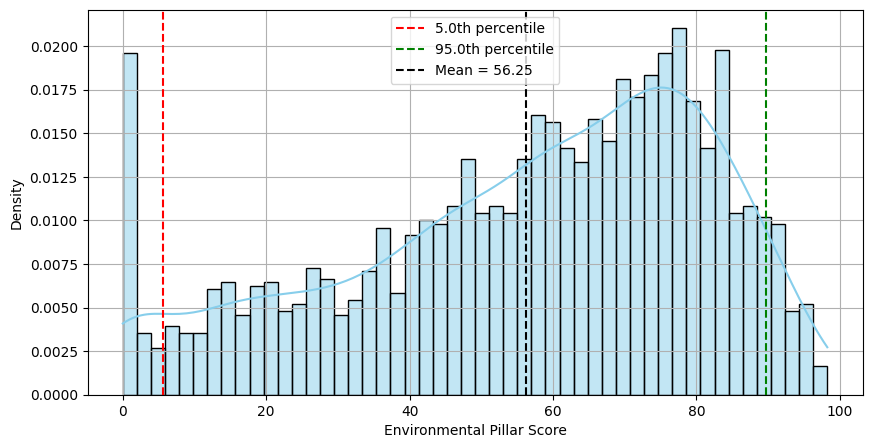

In [35]:
def plot_hist(df, col,xlow=None,xhigh=None,bins=50,kde=True,xaxis=None):
    if xaxis is None:
        xaxis = col
    fig, ax = plt.subplots(figsize=(10,5))
    sns.histplot(df.dropna(),x=col,
                 #hue='Year' ,
                 bins=bins, kde=kde, color='skyblue', edgecolor='black', stat='density',element='bars',multiple='layer',cbar=True)
    plt.grid(True)
    low, high = 0.05, 0.95
    p_low, p_high = df[col].dropna().quantile([low, high])
    ax.axvline(p_low, color='red', linestyle='--', label=f'{low*100}th percentile')
    ax.axvline(p_high, color='green', linestyle='--', label=f'{high*100}th percentile')
    mean = df[col].dropna().mean()
    ax.axvline(df[col].dropna().mean(), color='black', linestyle='--', label=f'Mean = {mean:.2f}')
    if xlow is not None and xhigh is not None:
        ax.set_xlim(xlow,xhigh)
    ax.set_xlabel(xaxis)
    plt.legend()
    plt.show()
plot_hist(SP500_ESG_Data, 'Environmental Pillar Score')

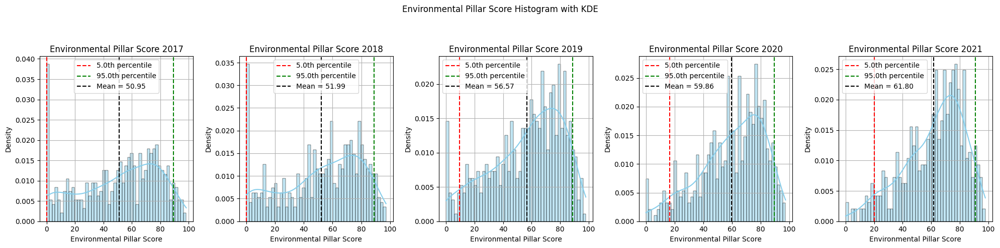

In [36]:
column = 'Environmental Pillar Score'
plot_hist_by_year(SP500_ESG_Data, column)

### 2.2.4. Extracting SASB Industry Classification for the S&P 500 Companies

In [37]:
def handle_search_bar(driver, name):
    try:
        # Wait for the search bar to be clickable
        url = "https://sasb.ifrs.org/standards/download/"
    
        driver.get(url)
        search_bar = WebDriverWait(driver, 1).until(EC.element_to_be_clickable((By.NAME, "search")))

        # Clear the search bar
        search_bar.clear()

        search_bar.send_keys(name)#+Keys.RETURN)
        search_bar.send_keys(Keys.RETURN)

        # Wait for page to load
        time.sleep(1)
        page_source = driver.page_source
        soup = BeautifulSoup(page_source, 'html.parser')
        # Parse the page source to find the industry classification
        h2_element = soup.find('h2', class_='mb-6 text-xs')
        text = h2_element.text.strip()
        if ' 0 ' in text:
            if ' Inc' in name and ', Inc' not in name:
                return handle_search_bar(driver, name.replace(' Inc',', Inc'))
            elif 'Co Inc' in name:
                return handle_search_bar(driver, name.replace('Co Inc','Co., Inc'))
            elif '!' in name:
                return handle_search_bar(driver, name.replace('!',''))
            elif '.' in name:
                return handle_search_bar(driver, name.replace('.',''))
            else:
                return 'Inexistant'
        span_element = soup.find('span', class_='text-sm')

        if span_element:
            text_content = span_element.text.strip()
            return text_content
        else:
            return 'Inexistant'

    except TimeoutException:
        print("Timeout occurred while waiting for the search bar to be clickable.")
        return None
    except NoSuchElementException as e:
        print(f"Element not found: {e}")
        return None
    
    """finally:
        driver.quit()"""

In [38]:
def add_point_after_capital_letters(s):
    # Regex pattern to match either: space, capital letter, space OR start of string, capital letter, space
    pattern = r'(\s[A-Z]\s|^([A-Z])\s)'
    
    # Replace the matched patterns with the captured letter followed by point and space
    result = re.sub(pattern, lambda x: f'{x.group(1)[:-1]}. ', s)
    
    return result

In [39]:
SP500_ESG_Data['Company Name'] = SP500_ESG_Data['Company Name'].apply(add_point_after_capital_letters)
def get_SASB_sector(SP500_ESG_Data):
    temp_dict = {'Ticker Symbol':[], 'Company Name':[],'SASB Industry Classification':[]}
    options = Options()
    options.add_experimental_option("detach", True)
    driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=options)
    for name in list(SP500_ESG_Data['Company Name'].unique()):
        """if 'Inc' in Ticker:
            print(Ticker,':', handle_search_bar(driver,Ticker.split(',')[0]))
        else:"""
        tic = SP500_ESG_Data[SP500_ESG_Data['Company Name']==name]['Ticker Symbol'].unique()[0]
        temp_dict['Ticker Symbol'].append(tic)
        temp_dict['Company Name'].append(name)
        temp_dict['SASB Industry Classification'].append(handle_search_bar(driver,name))
    driver.quit()    
    return pd.DataFrame(temp_dict)

In [40]:
def replace_characters(text):
    if not pd.isna(text):
        text = text.replace('&', 'And')
        text = text.replace('and', 'And')
        text = text.replace('-', ' ')
        text = text.replace(',', '')
        text = text.replace(' – ', ' ')
        text = text.replace(' IT ', ' It ')
        return text
    return 'Inexistant'

Uncomment following cell to check the scrapping of SASB Industrial Classification

In [41]:
#temp_df = get_SASB_sector(SP500_ESG_Data)
#SP500_SASB = pd.merge(SP500, temp_df, on='Ticker Symbol', how='left').drop(columns=['Company Name_y'])
#SP500_SASB["SASB Industry Classification"] = SP500_SASB["SASB Industry Classification"].apply(replace_characters)
#SP500_SASB["Topic"] = SP500_SASB["SASB Industry Classification"].apply(lambda x : Environmental[x] if x!='Inexistant' else np.nan)
#SP500_SASB.drop(columns=[col for col in SP500.columns if 'Unnamed' in col],inplace=True)
#SP500_SASB.to_csv("SP500_SASB.csv")

In [42]:
SP500_SASB = pd.read_csv("SP500_SASB.csv")
SP500_SASB

,Unnamed: 0,Ticker Symbol,Company Name_x,CIK Code,GICS Sector,Industry,SASB Industry Classification,Topic
0,0,MMM,3M,66740,Industrials,Industrial Conglomerates,Chemicals,"['Water Management', 'Greenhouse Gas Emissions..."
1,1,AOS,A. O. Smith,91142,Industrials,Building Products,Electrical And Electronic Equipment,"['Product Lifecycle Management', 'Energy Manag..."
2,2,ABT,Abbott,1800,Health Care,Health Care Equipment,Medical Equipment And Supplies,['Product Design & Lifecycle Management']
3,3,ABBV,AbbVie,1551152,Health Care,Biotechnology,Biotechnology And Pharmaceuticals,[]
4,4,ACN,Accenture,1467373,Information Technology,IT Consulting & Other Services,Software And It Services,['Environmental Footprint of Hardware Infrastr...
...,...,...,...,...,...,...,...,...
497,497,XYL,Xylem Inc.,1524472,Industrials,Industrial Machinery & Supplies & Components,Industrial Machinery And Goods,"['Energy Management', 'Fuel Economy & Emission..."
498,498,YUM,Yum! Brands,1041061,Consumer Discretionary,Restaurants,Restaurants,"['Water Management', 'Food & Packaging Waste M..."
499,499,ZBRA,Zebra Technologies,877212,Information Technology,Electronic Equipment & Instruments,Hardware,['Product Lifecycle Management']
500,500,ZBH,Zimmer Biomet,1136869,Health Care,Health Care Equipment,Medical Equipment And Supplies,['Product Design & Lifecycle Management']


## 2.3. Collecting Data for the Estimation of Excess Compensation

To estimate excess executive compensation, we utilized a comprehensive dataset from Compustat Execucomp's Annual Compensation database, covering the years 2014 to 2023. This data included detailed information about compensation packages, the dates executives became CEOs, and their ages for each specific year. We applied feature engineering to derive the logarithm of CEO tenure, calculated as the difference between the year they became CEO and the current year of the data. Additionally, stock close prices and sales data were sourced from Compustat North America's Annual Fundamentals database. We further applied feature engineering to generate the lagged logarithm of sales and logarithmic stock returns (RET) and their first lags.

Book-to-market ratios and return on assets (ROA) were also collected from Compustat North America's Financial Ratios and were reaggregated on an annual basis instead of daily, with the first lag of ROA being derived as well. These processed data points were used to aggregate total CEO compensation and determine the economic factors influencing CEO pay. As highlighted by Core et al. (2008), The logarithm of tenure served as a proxy for CEO entrenchment and risk aversion, under the premise that more risk-averse executives might seek excess compensation to offset their risk exposure. Logarithmic returns and their first lags, along with ROA and its first lag, were utilized to gauge the firm’s financial performance. The lagged logarithm of sales acted as a proxy for firm size, while the book-to-market ratio was used to assess growth opportunities. This multifaceted dataset was paramount for analyzing the determinants of excess CEO compensation. After visual inspection of the pair-plot in Figure 6 we noticed that all variables present a bell-shaped PDF and there is a strong linear correlation between the ROA and its first lag across all companies within each single year which is confirmed in the correlation heatmap.

### 2.3.1. Loading Data

In [43]:
ROA_B2M = pd.read_csv("Economic Determinants Data\\roa & b2m.csv")[['public_date','bm', 'roa', 'TICKER']]
ROA_B2M.rename(columns={'bm':'B2M','roa':'ROA','TICKER':'Ticker','public_date':'Date'},inplace=True)

PRCC_SALES = pd.read_csv("Economic Determinants Data\\prcc_c & sales.csv")[['fyear','sale','tic','prcc_c','sic']]
PRCC_SALES.rename(columns={'fyear':'Year','sale':'Sales','tic':'Ticker','prcc_c':'Close','sic':'SIC'},inplace=True)
PRCC_SALES.set_index(['Ticker','SIC', 'Year'], inplace=True)
PRCC_SALES['Sales'] = 1000000 * PRCC_SALES['Sales']

COMP_BECAMECEO = pd.read_csv("Economic Determinants Data\\SP500EXEC.csv")[['YEAR','BECAMECEO','AGE','TDC2','TICKER','LEFTOFC','SIC']]
COMP_BECAMECEO.rename(columns={'TICKER':'Ticker','YEAR':'Year','AGE':'Age','TDC2':'Total Compensation','BECAMECEO':'Became CEO','LEFTOFC':'Left Office'},inplace=True)

### 2.3.2. Feature Engineering

In [44]:
map = dict(zip(COMP_BECAMECEO['Ticker'], COMP_BECAMECEO['SIC']))

def mapper(x):
    if x in map.keys():
        return map[x]
    return np.NaN

In [45]:
def to_yearly(df):
    
    df['Year'] = df.index.get_level_values('Date').year
    averaged_df = df.groupby(['Ticker','SIC', 'Year']).last()
    
    return averaged_df

In [46]:
COMP_BECAMECEO.set_index(['Ticker','SIC', 'Year'], inplace=True)
COMP_BECAMECEO['Total Compensation'] = 1000*COMP_BECAMECEO['Total Compensation']
COMP_BECAMECEO['Became CEO'] = pd.to_datetime(COMP_BECAMECEO['Became CEO'])
COMP_BECAMECEO['Left Office'] = pd.to_datetime(COMP_BECAMECEO['Left Office'])

In [47]:
ROA_B2M.dropna(inplace=True)
ROA_B2M['Date'] = pd.to_datetime(ROA_B2M['Date'])
ROA_B2M['SIC'] = ROA_B2M['Ticker'].apply(mapper)
ROA_B2M.dropna(subset=['SIC'],inplace=True)
ROA_B2M['SIC'] = ROA_B2M['SIC'].astype(int)
ROA_B2M.set_index(['Ticker','SIC', 'Date'], inplace=True)
ROA_B2M.sort_index(inplace=True)

In [48]:
ROA_B2M_yearly = to_yearly(ROA_B2M)

In [49]:
COMP_BECAMECEO['Years'] = pd.to_datetime(COMP_BECAMECEO.index.get_level_values('Year'), format='%Y')
COMP_BECAMECEO['Tenure'] = (pd.to_datetime(COMP_BECAMECEO['Years'].dt.year, format='%Y') - COMP_BECAMECEO['Became CEO']).dt.days / 365.25 + 1
COMP_BECAMECEO.drop(columns=['Years'],inplace=True)
COMP_BECAMECEO['Log Tenure'] = np.log(COMP_BECAMECEO['Tenure'])
COMP_BECAMECEO['Log Total'] = np.log(COMP_BECAMECEO['Total Compensation'])


c:\Users\Lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning:

invalid value encountered in log

c:\Users\Lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning:

divide by zero encountered in log



In [50]:
COMP_BECAMECEO = COMP_BECAMECEO.sort_index()
df1 = COMP_BECAMECEO[['Log Tenure','Log Total']].loc[(slice(None), slice(None), slice(start, end)), :]

In [51]:
ROA_B2M_yearly['Lagged ROA'] = ROA_B2M_yearly.groupby('Ticker')['ROA'].shift(1)
ROA_B2M_yearly = ROA_B2M_yearly.sort_index()
df3 = ROA_B2M_yearly.loc[(slice(None), slice(None), slice(start, end)), :]

In [52]:
PRCC_SALES['Lagged Close'] = PRCC_SALES.groupby('Ticker')['Close'].shift(1)
PRCC_SALES['RET'] = np.log(PRCC_SALES['Close']/PRCC_SALES['Lagged Close'])
PRCC_SALES['Lagged RET'] = PRCC_SALES.groupby('Ticker')['RET'].shift(1)
PRCC_SALES['Log Lagged Sales'] = np.log(PRCC_SALES.groupby('Ticker')['Sales'].shift(1))

In [53]:
PRCC_SALES = PRCC_SALES.sort_index()
df2 = PRCC_SALES[['Log Lagged Sales','RET','Lagged RET']].loc[(slice(None), slice(None), slice(start, end)), :]

In [54]:
merged_df = pd.merge(df1, df2, left_index=True, right_index=True, how='inner')
Comp_dataset = pd.merge(merged_df, df3, left_index=True, right_index=True, how='inner')
Comp_dataset.dropna(inplace=True)
Comp_dataset = Comp_dataset[Comp_dataset.index.get_level_values('Ticker') != 'TSLA']
Comp_dataset

Log Tenure  Log Total  Log Lagged Sales       RET  \
Ticker SIC  Year                                                      
A      3826 2017    1.027221  16.372802         22.158826  0.385215   
            2018    1.333054  16.682076         22.221102  0.007290   
            2019    1.566932  16.439062         22.315354  0.234757   
            2020    1.756346  16.902044         22.364784  0.328537   
            2021    1.915936  16.586074         22.398304  0.298155   
...                      ...        ...               ...       ...   
ZBRA   3577 2017    2.334845  16.191298         21.996951  0.190913   
            2018    2.427205  17.217152         22.037527  0.427884   
            2019    2.511751  16.918004         22.162627  0.472638   
            2020    2.589702  16.955137         22.224004  0.408514   
            2021    2.662206  17.459766         22.215720  0.437396   

                  Lagged RET    B2M    ROA  Lagged ROA  
Ticker SIC  Year                                        
A      3826 2017    0.085895  0.224  0.135       0.126  
            2018    0.385215  0.225  0.142       0.135  
            2019    0.007290  0.204  0.142       0.142  
            2020    0.234757  0.157  0.140       0.142  
            2021    0.328537  0.115  0.170       0.140  
...                      ...    ...    ...         ...  
ZBRA   3577 2017    0.208070  0.141  0.137       0.112  
            2018    0.190913  0.127  0.181       0.137  
            2019    0.427884  0.152  0.199       0.181  
            2020    0.472638  0.144  0.169       0.199  
            2021    0.408514  0.102  0.219       0.169  

[1917 rows x 8 columns]

### 2.3.3. Exploratory Data Analysis

In [55]:
grouped_by_year = Comp_dataset.groupby(level='Year')

data_by_year = {}
for year, group_df in grouped_by_year:
    data_by_year[year] = group_df.replace([np.inf, -np.inf], np.nan).dropna(how='any')

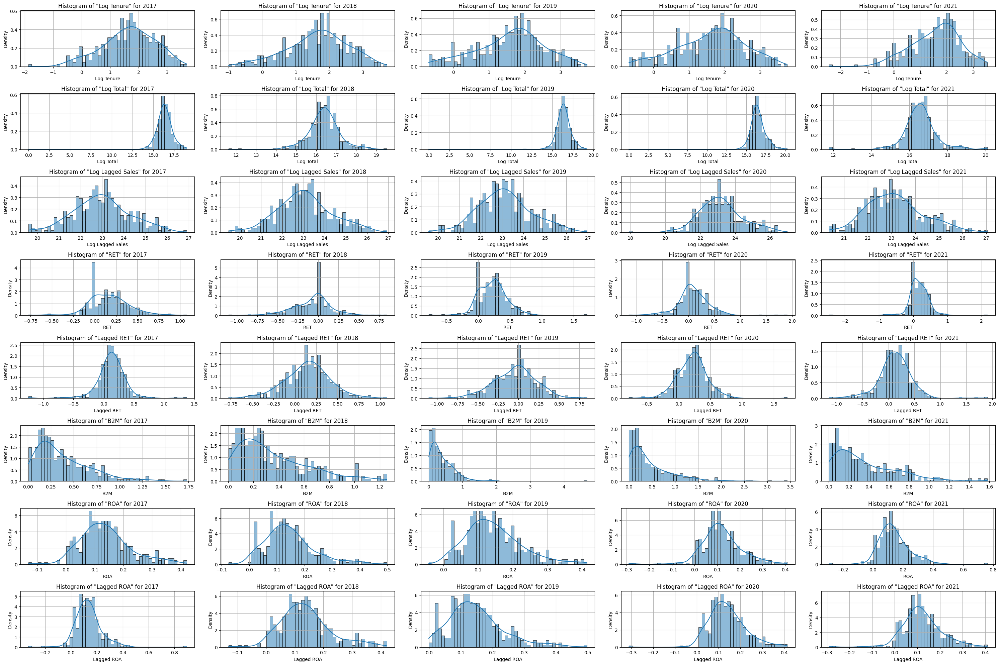

In [56]:
numeric_columns = Comp_dataset.select_dtypes(include='number').columns
unique_years = Comp_dataset.index.get_level_values('Year').unique()

num_rows = len(numeric_columns)
num_cols = len(unique_years) 

fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 20))
if num_rows == 1 and num_cols == 1:
    axes = [[axes]]

for i, year in enumerate(unique_years):
    for j, column in enumerate(numeric_columns):
        ax = axes[j][i]
        sns.histplot(data=Comp_dataset.loc[Comp_dataset.index.get_level_values('Year') == year], x=column, bins=50, kde=True, stat='density', ax=ax)
        ax.set_title(f'Histogram of "{column}" for {year}')
        ax.set_xlabel(column)
        ax.set_ylabel('Density')
        ax.grid(True)

plt.tight_layout()
plt.show()

$\implies$ All variables, except Book to Market (B2M), seem to present double tailed distributions with Normal or Log-Normal like shapes.

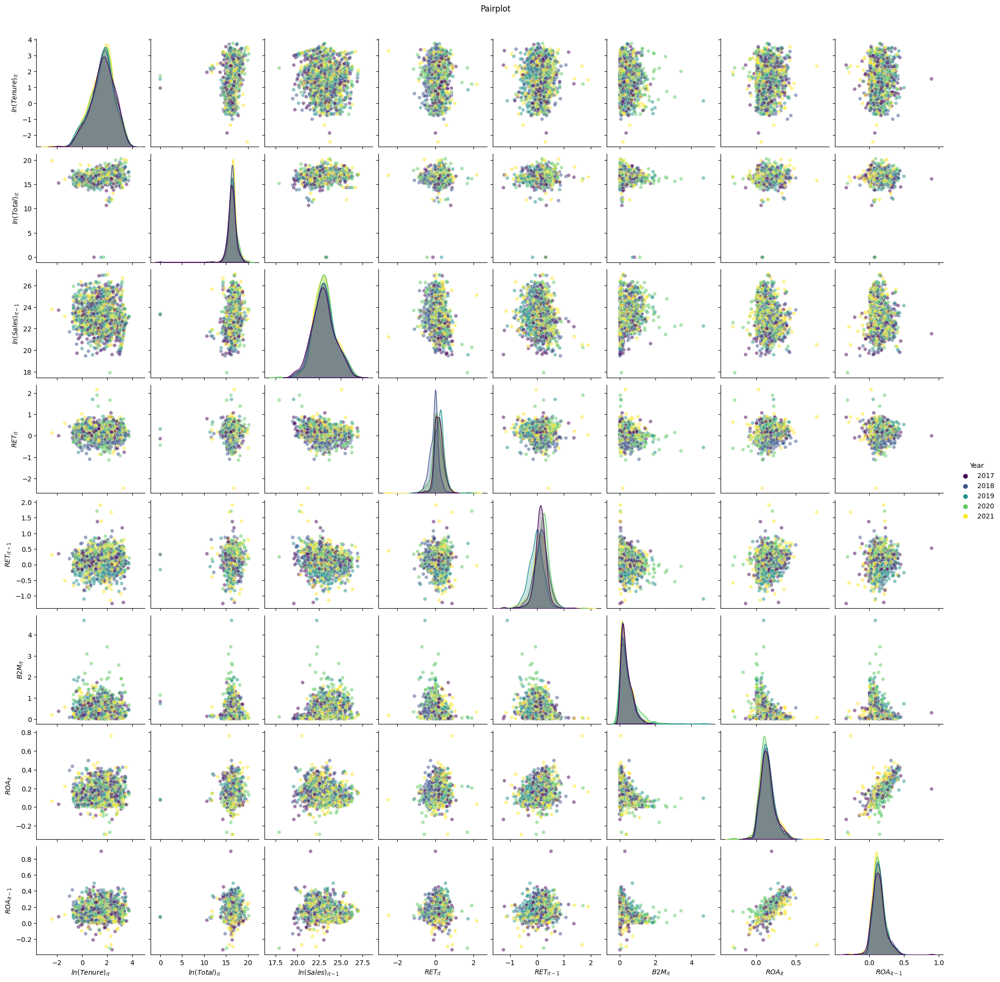

In [57]:
pairplot = sns.pairplot(
        Comp_dataset.reset_index().drop(columns=['SIC']),
        diag_kind='kde',                    # Set diagonal plot type to KDE (Kernel Density Estimate)
        hue='Year',                         # Specify a categorical variable for coloring data points
        palette='viridis',                  # Choose a color palette for categorical levels
        markers='o',                        # Set marker style for data points
        plot_kws={'alpha': 0.5, 's': 30},   # Additional keyword arguments for scatter plots
        diag_kws={'shade': True}            # Additional keyword arguments for diagonal plots (KDE)
    )    
pairplot.fig.suptitle(f'Pairplot', y=1.02) # of Expected Compensation Regression Data
new_labels = {'Log Tenure':'$ln(Tenure)_{it}$', 'Log Total':'$ln(Total)_{it}$', 'Log Lagged Sales':'$ln(Sales)_{it-1}$', 'RET':'$RET_{it}$', 'Lagged RET':'$RET_{it-1}$','B2M':'$B2M_{it}$', 'ROA':'$ROA_{it}$', 'Lagged ROA':'$ROA_{it-1}$'}
for ax in pairplot.axes.flatten():
    if ax.get_xlabel() in new_labels:
        ax.set_xlabel(new_labels[ax.get_xlabel()])
    if ax.get_ylabel() in new_labels:
        ax.set_ylabel(new_labels[ax.get_ylabel()])
plt.grid(True)
plt.show()

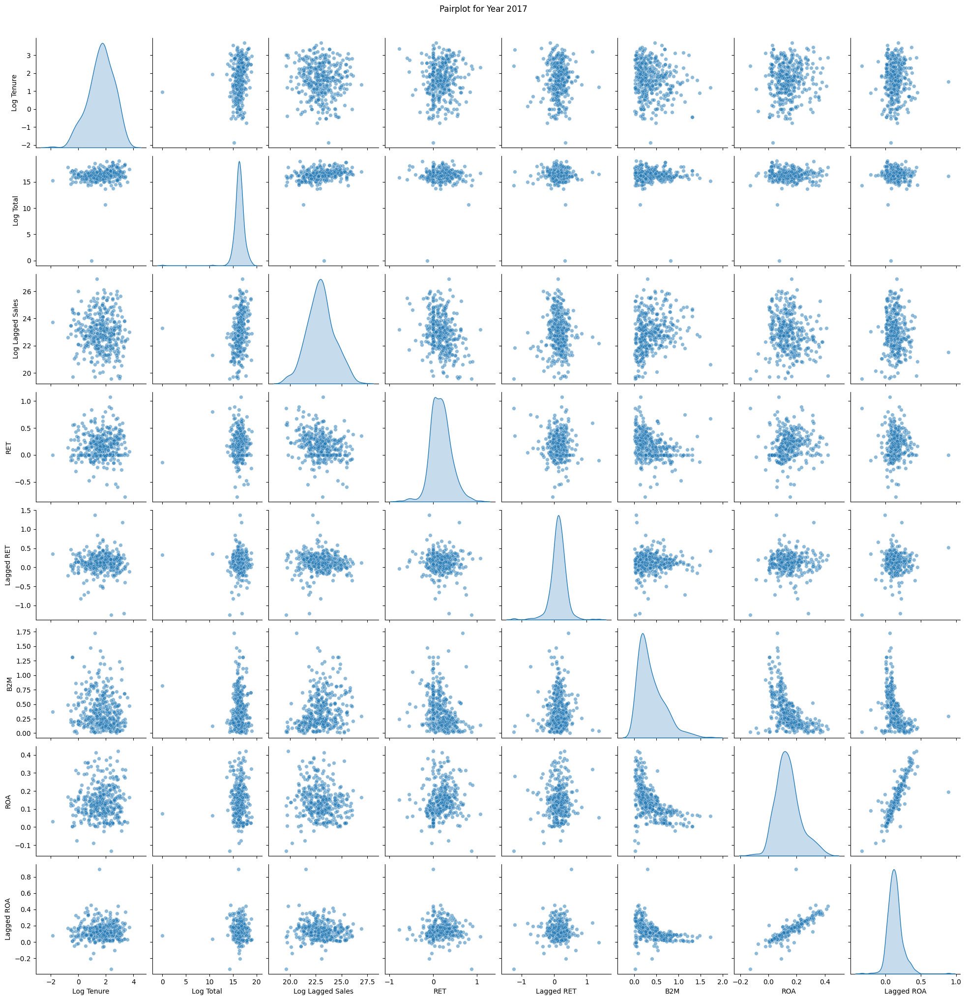

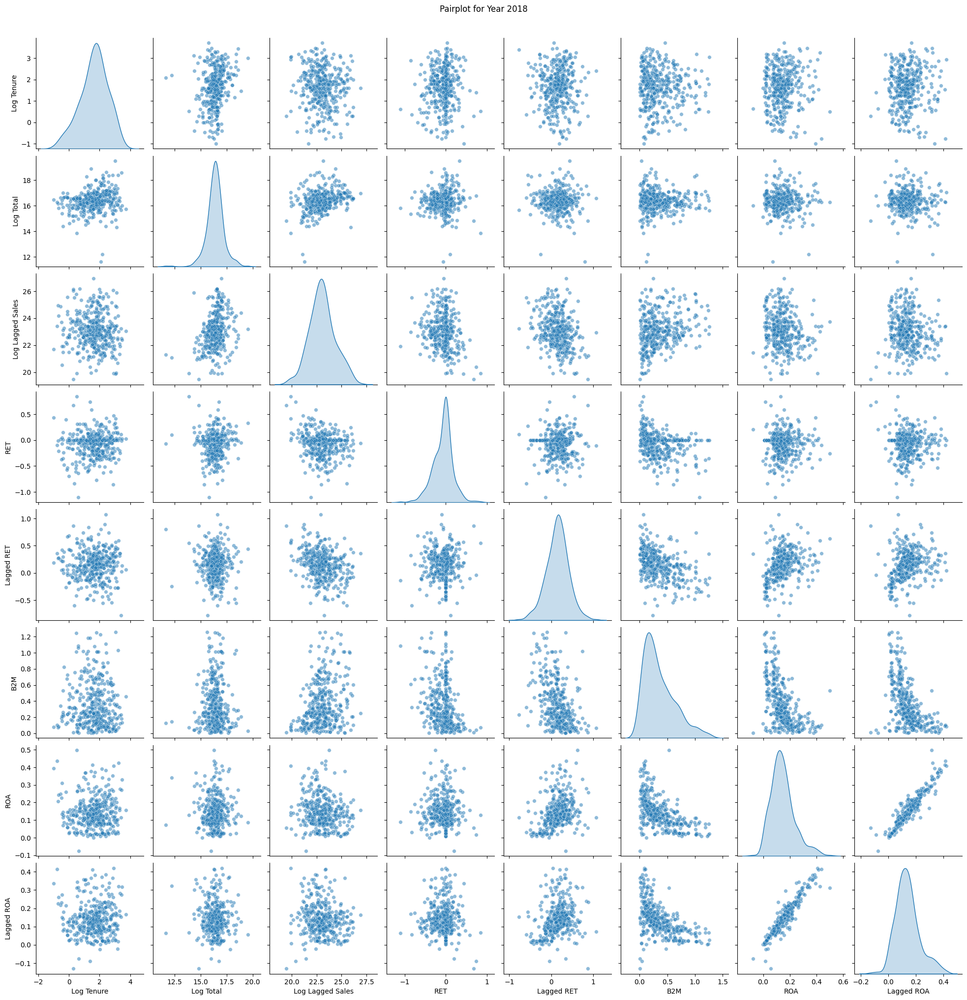

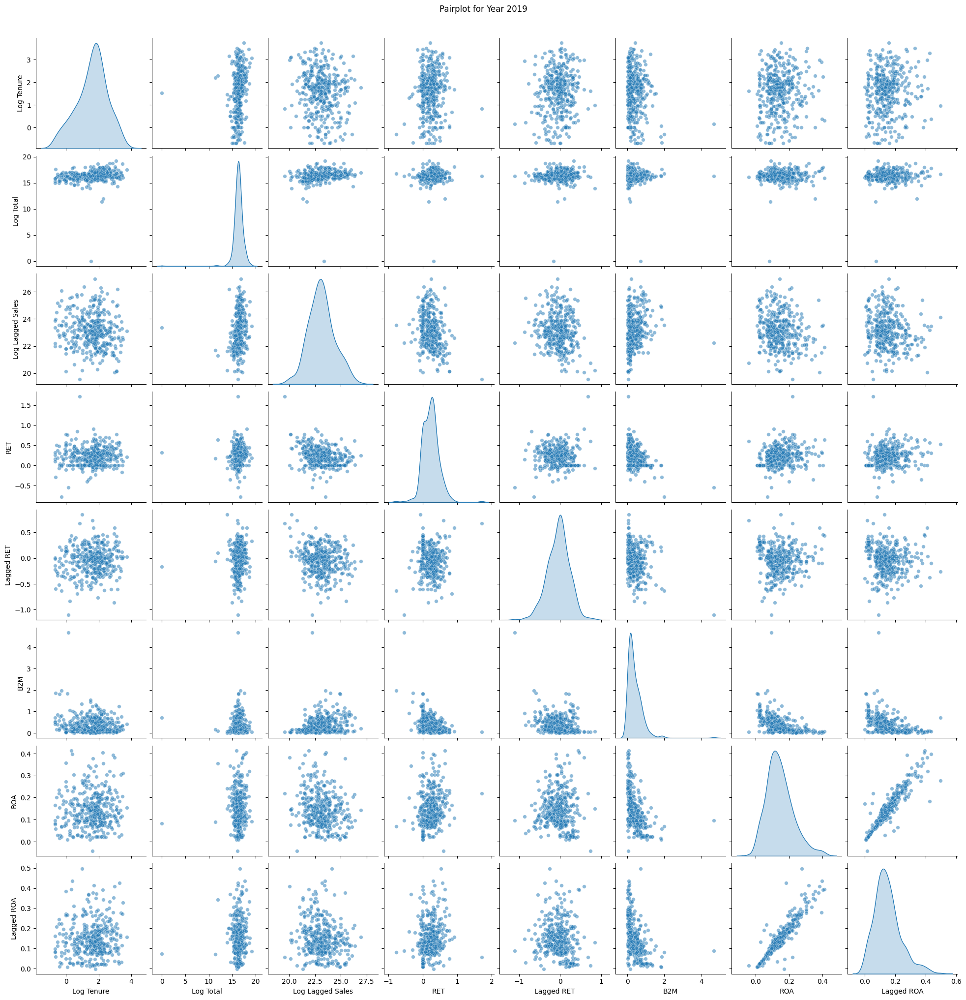

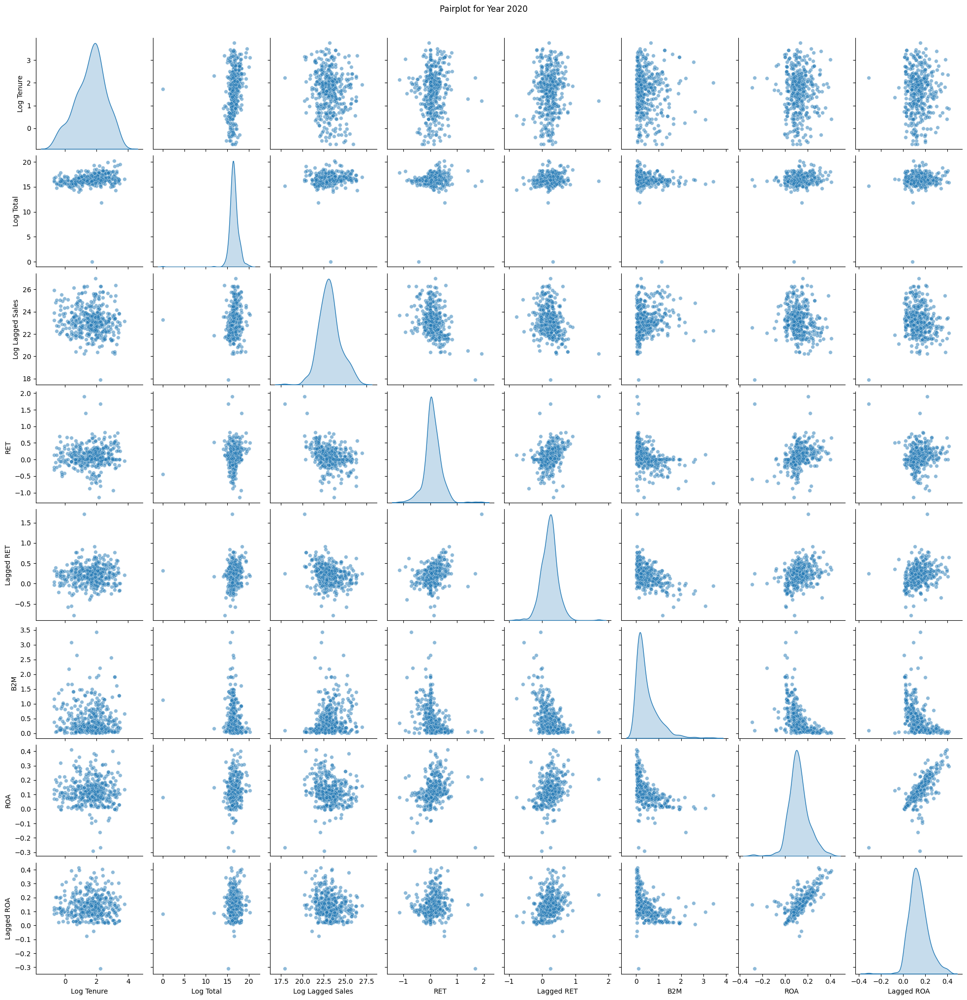

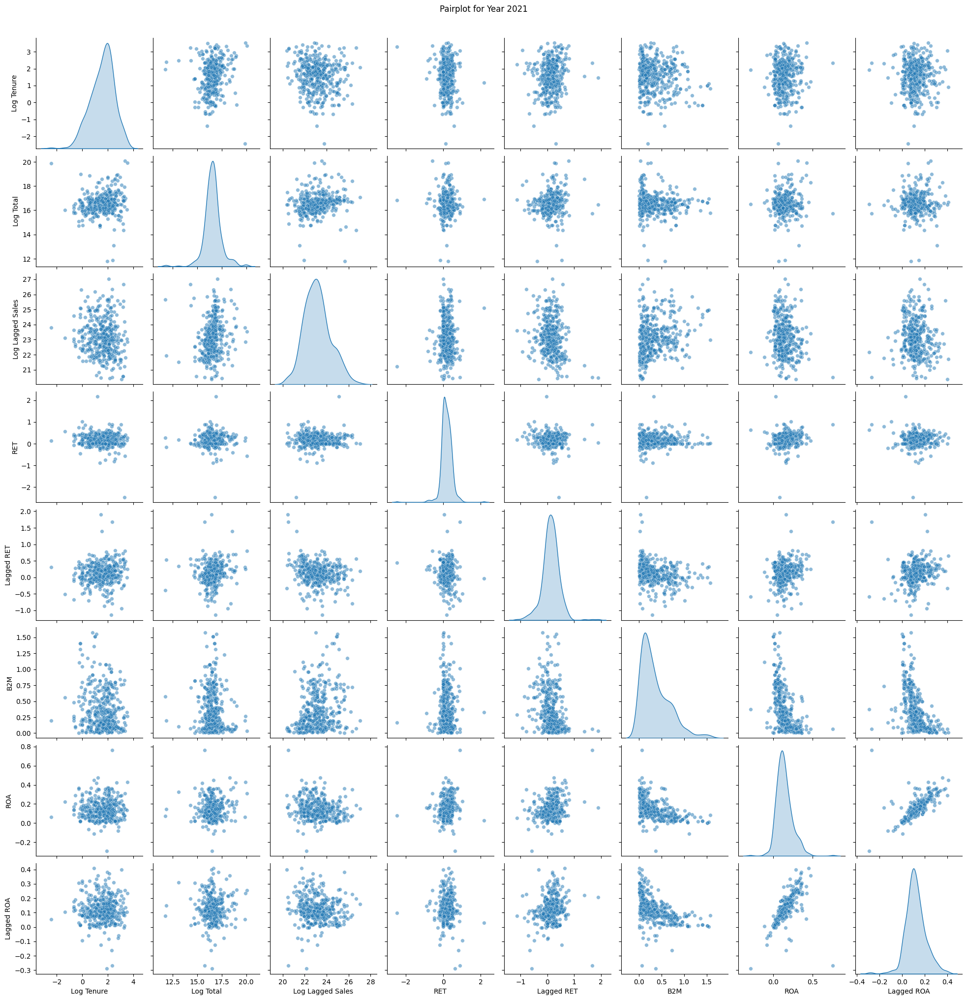

In [58]:
for year in data_by_year.keys():
    pairplot = sns.pairplot(
        data_by_year[year],
        diag_kind='kde',    # Set diagonal plot type to KDE (Kernel Density Estimate)
        #hue='Log Tenure',     # Specify a categorical variable for coloring data points
        #palette='viridis',  # Choose a color palette for categorical levels
        markers='o',        # Set marker style for data points
        plot_kws={'alpha': 0.5, 's': 30},  # Additional keyword arguments for scatter plots
        diag_kws={'shade': True}  # Additional keyword arguments for diagonal plots (KDE)
    )    
    pairplot.fig.suptitle(f'Pairplot for Year {year}', y=1.02) 
    plt.grid(True)
    plt.show()

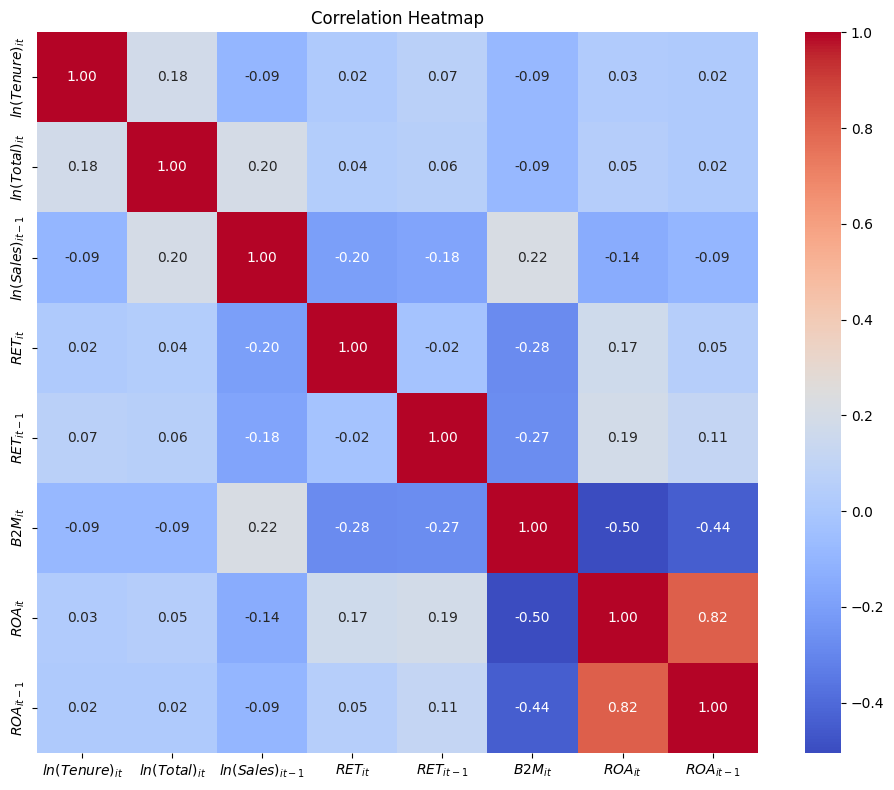

In [59]:
fig, ax = plt.subplots(figsize=(10, 8))
corr_matrix = Comp_dataset.corr()
labels = ['$ln(Tenure)_{it}$', '$ln(Total)_{it}$', '$ln(Sales)_{it-1}$','$RET_{it}$','$RET_{it-1}$','$B2M_{it}$','$ROA_{it}$','$ROA_{it-1}$']
sns.heatmap(corr_matrix,ax=ax, annot=True, cmap='coolwarm', fmt=".2f",square=True,xticklabels=labels,yticklabels=labels)
ax.set_title(f'Correlation Heatmap')

plt.tight_layout()
plt.show()

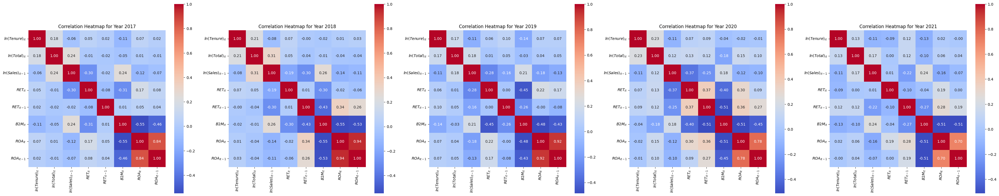

In [60]:
fig, axes = plt.subplots(1, 5, figsize=(25*1.5, 5*1.5))

axes = axes.flatten()
for i, (year, data) in enumerate(data_by_year.items()):
    
    corr_matrix = data.corr()
    sns.heatmap(corr_matrix, ax=axes[i], annot=True, cmap='coolwarm', fmt=".2f",square=True,xticklabels=labels,yticklabels=labels)
    axes[i].set_title(f'Correlation Heatmap for Year {year}')

plt.tight_layout()
plt.show()


$\implies$ By inspecting the pairplots over the years and the correlation heatmaps, we come to the conclusion that $ROA_t$ and $ROA_{t-1}$ tend to exhibit a high correlation across companies and this behavior seems to persist throughout the years which suggests the possibility of eliminating the lagged Return on Asset in the regression model.

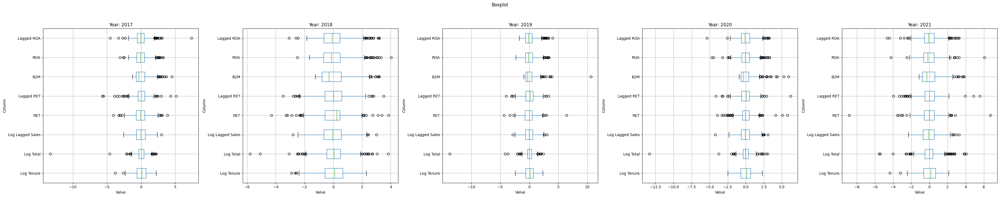

In [61]:
fig, axes = plt.subplots(1,5, figsize=(25*1.5, 5*1.5))
axes = axes.flatten()

scaler = StandardScaler()

for i, (year, data) in enumerate(data_by_year.items()):
    
    scaled_data = scaler.fit_transform(data)
    scaled_df = pd.DataFrame(scaled_data, columns=data.columns, index=data.index)
    scaled_df.boxplot(ax=axes[i], vert=False)
    axes[i].set_title(f'Year: {year}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Column')

fig.suptitle('Boxplot\n\n')
plt.tight_layout()
plt.show()

$\implies$ The Boxplots suggest the potential of some outliers that need to be further investigated and winsorized or excluded from the data. 

## 2.4. Collecting Executive Board Data for the Econometric Model

Moreover, data on whether the CEO is a board member, the size of the board, and the board's independence were gathered from Refinitiv Eikon, like the Environmental pillar score query and treatment. Board size and independence are proxies for governance, following the methodology of Shams Pathan (2009). The inclusion of the binary variable indicating whether the CEO is also a board member is designed to further proxy CEO power within the company, complementing the variable of whether the CEO was a past employee as shown in prior literature.

Combining these data points, we measured greenhushing intensity on a scale from 0 to 1 and its existence as a binary variable indicating an intensity greater than 0,5. We then estimated excess compensation to compile our final sample, which was winsorized using IQR range to aggregate 1,841 firm-year observations. This unbalanced panel dataset includes the dependent variable of excess CEO compensation and independent variables such as economic determinants of CEO pay, governance variables, CEO power proxies, and greenhushing measures. We will use this comprehensive dataset to analyze the relationship between greenhushing and excess executive compensation, contributing valuable insights to the discourse on corporate governance and environmental transparency.


### 2.4.1. Data Loading & Precprocessing (Format Change)

In [62]:
Board_Data = treat_refinitiv_data('Board Data\\Board Data.xlsx', ['Ticker Symbol', 'Company Name'], ['Board Size', 'Independent Board Members', 'CEO Board Member'], start, end)

In [63]:
def is_past_emp(date1, date2):
    try:
        difference = relativedelta(date2, date1)
        
        # Check if the difference is at least one month
        if difference.years > 0 or (difference.months > 0 and difference.days >= 0):
            return 1
        else:
            return 0
    except Exception as e:
        return np.nan  # Return a special value to indicate an error

In [64]:
Employment = pd.read_csv("Economic Determinants Data\\SP500EXEC.csv")[['YEAR','BECAMECEO', 'JOINED_CO','TICKER']].rename(columns={'TICKER':'Ticker Symbol','YEAR':'Year', 'JOINED_CO':'Joined Company', 'BECAMECEO':'Became CEO'})
Employment['Joined Company'].fillna(Employment['Became CEO'], inplace=True)
Employment = Employment[Employment['Year'].between(start, end)].sort_values(['Ticker Symbol','Year'])

Employment['Became CEO'] = pd.to_datetime(Employment['Became CEO'])
Employment['Joined Company'] = pd.to_datetime(Employment['Joined Company'])

Employment['CEO Past Employee'] = Employment.apply(lambda row: is_past_emp(row['Joined Company'], row['Became CEO']), axis=1)

In [65]:
CEO_Power = pd.merge(Employment[['Year', 'Ticker Symbol', 'CEO Past Employee']], Board_Data[['Year', 'Ticker Symbol', 'CEO Board Member']], on=['Ticker Symbol', 'Year'], how='inner')
CEO_Power['CEO Board Member'] = CEO_Power['CEO Board Member'].apply(lambda x: x if pd.isna(x) else int(x)) 

### 2.4.2. Exploring the Data

In [66]:
CEO_Power

,Year,Ticker Symbol,CEO Past Employee,CEO Board Member
0,2017,A,0.0,1.0
1,2018,A,0.0,1.0
2,2019,A,0.0,1.0
3,2020,A,0.0,1.0
4,2021,A,0.0,1.0
...,...,...,...,...
2426,2017,ZTS,0.0,1.0
2427,2018,ZTS,0.0,1.0
2428,2019,ZTS,0.0,1.0
2429,2020,ZTS,0.0,1.0


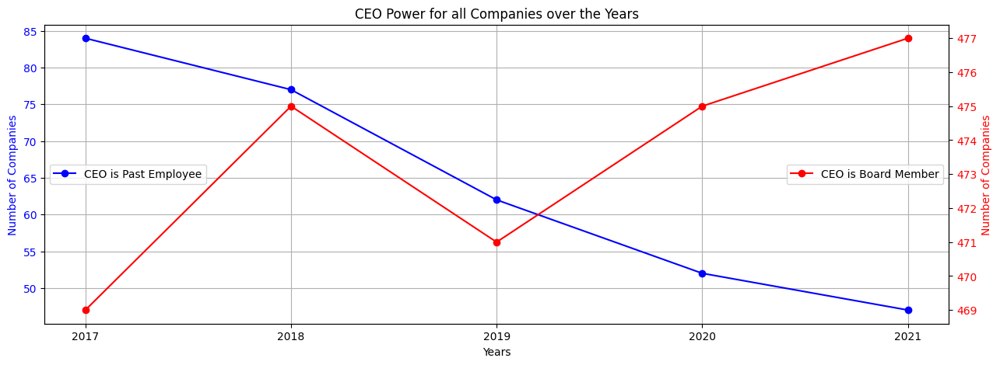

In [67]:
Timestamps = []
Emp = []
Board = []
for year, frame in CEO_Power.groupby('Year'):
    Timestamps.append(year)
    Emp.append((frame['CEO Past Employee']==1.0).sum())
    Board.append((frame['CEO Board Member']==1.0).sum())

fig, ax1 = plt.subplots(figsize=(15, 5))

ax1.plot(Timestamps, Emp, marker='o', label='CEO is Past Employee', color='b')
ax1.set_xlabel('Years')
ax1.set_ylabel('Number of Companies', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.legend(loc='center left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(Timestamps, Board, marker='o', label='CEO is Board Member', color='r')
ax2.set_ylabel('Number of Companies', color='r')
ax2.tick_params(axis='y', labelcolor='r')
ax2.legend(loc='center right')

plt.xticks(Timestamps) 
plt.title('CEO Power for all Companies over the Years')
plt.show()

In [68]:
Board_Data.drop(columns=['CEO Board Member'],inplace=True)
Board_Data

,Ticker Symbol,Company Name,Year,Board Size,Independent Board Members
0,A,Agilent Technologies Inc,2017,11.0,90.909091
1,A,Agilent Technologies Inc,2018,10.0,91.666667
2,A,Agilent Technologies Inc,2019,11.0,90.909091
3,A,Agilent Technologies Inc,2020,11.0,90.909091
4,A,Agilent Technologies Inc,2021,11.0,91.666667
...,...,...,...,...,...
2485,ZTS,Zoetis Inc,2017,11.0,90.909091
2486,ZTS,Zoetis Inc,2018,11.0,90.909091
2487,ZTS,Zoetis Inc,2019,11.0,90.909091
2488,ZTS,Zoetis Inc,2020,13.0,84.615385


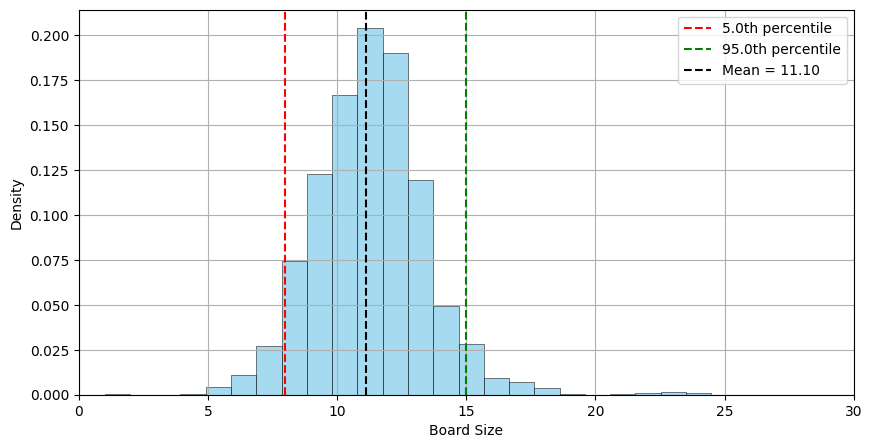

In [69]:
plot_hist(Board_Data,'Board Size',0,30,140,kde=False)

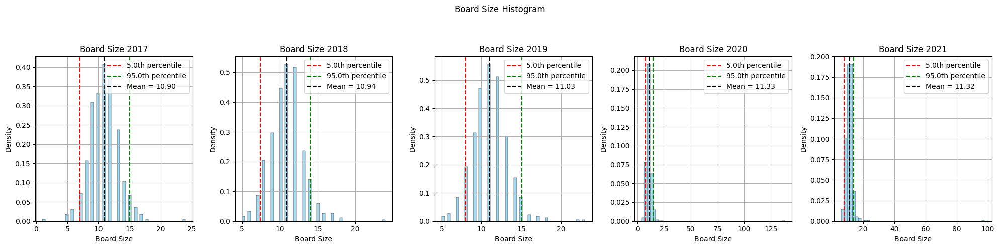

In [70]:
column = 'Board Size'
plot_hist_by_year(Board_Data,column,False)

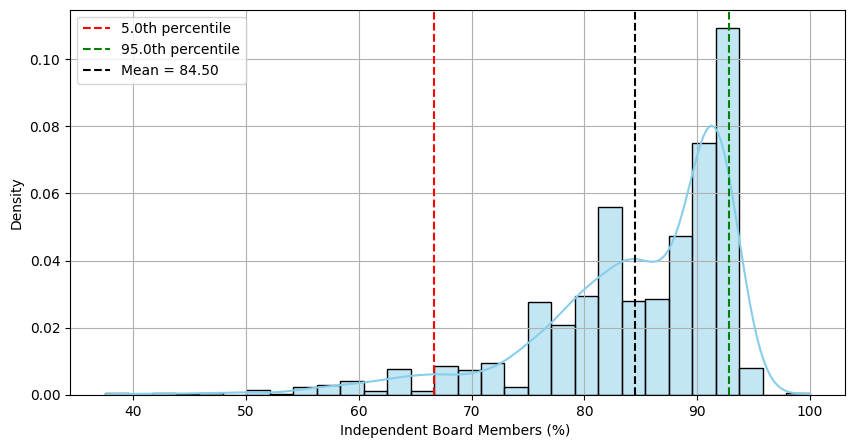

In [71]:
plot_hist(Board_Data,'Independent Board Members',bins=30,xaxis='Independent Board Members'+' (%) ')

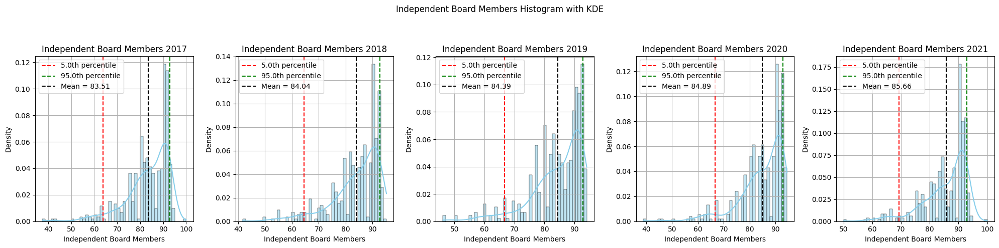

In [72]:
column = 'Independent Board Members'
plot_hist_by_year(Board_Data,column)

# 3. Estimating Excess Execustive Compensation

Mathematically, and within the framework outlined by Syed Ali Rahat Jafri and Samir Trabelsi (2014), excess compensation is computed as the difference between total compensation and expected compensation. To derive the expected compensation, a regression model is employed, where the natural logarithm of total CEO compensation $Ln(Total~Pay)_{it}$ is regressed on various proxies representing economic determinants of CEO pay $ED_{it}$. These proxies encapsulate critical factors such as firm performance, firm size, growth opportunities, and industry controls. Specifically,

$$
Ln(Total~Compensation)_{it} = \beta_0 + \beta_1.ED_{it} + \varepsilon_{it}
$$

where 
$ED_{it}$
 encompasses variables such as book to market $B2M_{it}$ to proxy for growth opportunities, the logarithm of CEO's tenure $Ln(Tenure)_{it}$ as CEOs with longer tenure are more likely to be entrenched and will seek to avoid risk (Berger et al. 1997), sales growth $Ln(Sales)_{it-1}$ to proxy for firm size, stock return $RET_{it}$ and $RET_{it-1}$, and return on asset $ROA_{it}$ and $ROA_{it-1}$ as proxies for firm performance (Core et al. 2008). 

$$
ED_{it} = \begin{pmatrix} B2M_{it}\\Ln(Tenure)_{it} \\ Ln(Sales)_{it-1}\\ RET_{it}\\RET_{it-1}\\ ROA_{it}\\ROA_{it-1} \end{pmatrix}
$$

Through this regression, the expected compensation can be derived as

$$
Ln(Expected~Compensation)_{it} = \beta_0 + \beta_1.ED_{it}
$$

which can be transformed into expected compensation as $e^{Ln(Expected~Compensation)}$. This rigorous estimation approach enables a nuanced understanding of the factors driving CEO compensation and allows for the identification of any excess compensation beyond what is expected based on economic determinants.

## 3.1. Estimating Expected Compensation: Model Selection

In [73]:
def hausman_test(y, X):
    """
    Perform the Hausman test to choose between Fixed Effects (FE) and Random Effects (RE) models.
    
    Parameters:
    y (array-like): Dependent variable.
    X (array-like): Independent variables (including intercept).
    
    Returns:
    float: Hausman test statistic.
    float: P-value of the Hausman test.
    """
    # Fixed Effects
    fe_model = PanelOLS(y, X, entity_effects=True)
    fe_results = fe_model.fit()
    
    # Random Effects 
    re_model = RandomEffects(y, X)
    re_results = re_model.fit()
    
    # Difference in coefficients
    b_fe = fe_results.params
    b_re = re_results.params
    diff = b_fe - b_re
    
    # Difference in covariance matrices
    cov_fe = fe_results.cov
    cov_re = re_results.cov
    diff_cov = cov_fe - cov_re
    
    # Hausman test statistic
    hausman_stat = diff.T.dot(np.linalg.inv(diff_cov).dot(diff))
    
    # Degrees of freedom
    degrees_freedom = len(b_fe)
    
    # Calculate p-value
    p_value = 1 - stats.chi2.cdf(hausman_stat, degrees_freedom)
    
    # Result interpretation
    conclusion = 'Random Effects' if p_value > 0.05 else 'Fixed Effects'
    
    hausman_results = {
        'Statistic': [hausman_stat],
        'P-Value': [p_value],
        'Conclusion': [conclusion]
    }
    
    return pd.DataFrame(hausman_results).T.rename(columns={0:'Hausman Test'})

In [74]:
panel_data = Comp_dataset.copy().reset_index().set_index(['Ticker', 'Year'])
panel_data = panel_data.replace([np.inf, -np.inf], np.nan).dropna(how='any')

Y = panel_data['Log Total']
X = panel_data[['B2M', 'Log Tenure', 'Log Lagged Sales', 'RET', 'Lagged RET', 'ROA', 'Lagged ROA']]
hausman_test(Y,X)

,Hausman Test
Statistic,60.212906
P-Value,0.0
Conclusion,Fixed Effects


### 3.1.1. Models Fitting

In [75]:
def smape(y_true, y_pred):
    """
    Calculate the symmetric mean absolute percentage error (sMAPE).

    Parameters:
    y_true (array-like): Array of actual values.
    y_pred (array-like): Array of forecasted values.

    Returns:
    float: sMAPE value.
    """
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    smape = np.mean(numerator / denominator) 
    
    return smape

In [76]:
def model_fit(Y, X, file_path):    
    
    model_dict = {'Pooled OLS Model':PooledOLS(Y, X),'Fixed Effects Model':PanelOLS(Y, X, entity_effects=True),'Random Effects Model':RandomEffects(Y,X)}
    model_res = {}
    residuals_dict = {}
    metrics_dict = {}

    for key, model in model_dict.items():
        results = model.fit()
        model_res[key] = results
        residuals_dict[key] = results.resids
        Y_chap = results.predict(X)
        metrics_dict[key] = [results.loglik, np.log(results.nobs)*len(results.params)-2*results.loglik, 2*len(results.params)-2*results.loglik, smape(Y,Y_chap)]

    comparison_table = compare(model_res, precision='tstats', stars=True)

    metrics_df = pd.DataFrame(metrics_dict,index=['Log Likelihood','BIC','AIC','sMAPE']).round(2)
    metrics_df.loc['Log Likelihood'] = metrics_df.loc['Log Likelihood'].astype(str)
    metrics_df.loc['BIC'] = metrics_df.loc['BIC'].astype(str)
    metrics_df.loc['AIC'] = metrics_df.loc['AIC'].astype(str)
    metrics_df.loc['sMAPE'] = metrics_df.loc['sMAPE'].astype(str)
    metrics_df.loc['Log Likelihood', metrics_df.loc['Log Likelihood'].astype(float).idxmax()] += '**'
    metrics_df.loc['BIC', metrics_df.loc['BIC'].astype(float).idxmin()] += '*'
    metrics_df.loc['AIC', metrics_df.loc['AIC'].astype(float).idxmin()] += '*'
    metrics_df.loc['sMAPE', metrics_df.loc['sMAPE'].astype(float).idxmin()] += '*'

    html_content = comparison_table._repr_html_()

    soup = BeautifulSoup(html_content, 'html.parser')
    table = soup.find('table', {'class': 'simpletable'})
    rows = table.find_all('tr')

    headers = [th.get_text(strip=True) for th in rows[0].find_all('th')]
    headers.insert(0, 'Metric')

    data = []

    for row in rows[1:]:
        cols = row.find_all(['th', 'td'])
        cols = [ele.get_text(strip=True) for ele in cols]
        data.append(cols)

    df = pd.DataFrame(data, columns=headers)
    pd.concat([df.set_index('Metric'),metrics_df]).to_excel(file_path+'.xlsx')
    
    return comparison_table, residuals_dict, metrics_df

In [77]:
comparison_table, residuals_dict, metrics_df = model_fit(Y, X,'Compensation')
display(comparison_table)
display(metrics_df)

,Pooled OLS Model,Fixed Effects Model,Random Effects Model
Dep. Variable,Log Total,Log Total,Log Total
Estimator,PooledOLS,PanelOLS,RandomEffects
No. Observations,1917,1917,1917
Cov. Est.,Unadjusted,Unadjusted,Unadjusted
R-squared,0.9950,0.0637,0.9848
R-Squared (Within),0.0100,0.0637,0.0526
R-Squared (Between),0.9968,0.8088,0.9966
R-Squared (Overall),0.9950,0.8079,0.9949
F-statistic,5.407e+04,14.628,1.768e+04
P-value (F-stat),0.0000,0.0000,0.0000


,Pooled OLS Model,Fixed Effects Model,Random Effects Model
Log Likelihood,-3014.25,-1932.17**,-2184.7
BIC,6081.4,3917.25*,4422.3
AIC,6042.49,3878.34*,4383.39
sMAPE,0.06*,0.56,0.06


The model with neither time nor entity effects yields the highest R² (overall) among all models and Lagged ROA variable's coefficient is not significantly different from zero which confirms the insights of the exploratory data analysis. 

### 3.1.2. Residual Analysis & Model Selection

In [78]:
residuals_df = pd.DataFrame({Y.name: Y})
for key, residuals in residuals_dict.items():
    residuals_df[key] = residuals.values

In [79]:
def plot_resid_vs_dep(dep, residuals_df,xlim_low=None, xlim_high=None, ylim_low=None, ylim_high=None):
    melted_df = residuals_df.melt(id_vars=[dep], var_name='Model', value_name='Residuals')
    fig = px.scatter(melted_df, x=dep, y='Residuals', color='Model',
                    title='Residuals vs Dependent Variable for Different Time and Entity Effects Combinations',
                    labels={dep: f'Dependent Variable ({dep})', 'Residuals': 'Residuals'})
    if (xlim_low is not None) and (xlim_high is not None):
        fig.update_xaxes(range=[xlim_low, xlim_high]) 
    if (ylim_low is not None) and (ylim_high is not None):
        fig.update_yaxes(range=[ylim_low, ylim_high]) 
    fig.show()

In [80]:
plot_resid_vs_dep(Y.name,residuals_df,12,20,-4,4)

After visual inspection, all models' residuals exhibit a certain degree of a linear correlation with the dependent variable. However, the model with neither time nor entity effects tends to yield the residuals that are the most sparse around the dependent variable suggesting the weakest correlation amongst all models.

In [81]:
def plot_resid_distribution_and_qqplot(residuals_dict, xlim_low=None, xlim_high=None, ylim_low=None, ylim_high=None, bins=50,fit=True, line = False,std_gaussian=False):    
    fig, axes = plt.subplots(2, 3, figsize=(3*5, 2*4.5))
    axes = axes.flatten()

    for i, (model_key, residuals) in enumerate(residuals_dict.items()):
        
        sns.histplot(residuals, bins=bins, kde=True, color='skyblue', edgecolor='black', ax=axes[i], stat='density', label='Residuals PDF')
        
        if std_gaussian:
            mu, sigma = np.mean(residuals), np.std(residuals)
            x_values = np.linspace(mu - 4 * sigma, mu + 4 * sigma, 100)
            gaussian_pdf = stats.norm.pdf(x_values, mu, sigma)
            
            axes[i].plot(x_values, gaussian_pdf, color='red', linestyle='--', label='Gaussian PDF')
        axes[i].axvline(x=np.mean(residuals), color='black', linestyle='--', label='Residuals Mean')
        axes[i].set_title(f'Residuals: {model_key}')
        axes[i].set_xlabel('Residuals')
        axes[i].set_ylabel('Density')
        if (xlim_low is not None) and (xlim_high is not None):
            axes[i].set_xlim([xlim_low, xlim_high])
        if (ylim_low is not None) and (ylim_high is not None):
            axes[i].set_ylim([ylim_low, ylim_high])
        axes[i].legend()
        axes[i].grid(True)
        stats.probplot(residuals,dist="norm", plot=axes[i+3])
        if line :
            axes[i+3].plot(axes[i+3].get_xlim(), axes[i+3].get_xlim(), color='red', linestyle='--', label='45-Degree Line')
        axes[i+3].set_title(f'QQ Plot of Residuals for {model_key}')
        axes[i+3].set_xlabel('Gaussian Quantiles')
        axes[i+3].set_ylabel('Residual Quantiles')
        axes[i+3].grid(True)
        if line:
            axes[i+3].legend()
    fig.suptitle("The Distributions & QQ-Plots of Residuals $\epsilon_{it}$")
    plt.tight_layout()
    plt.show()

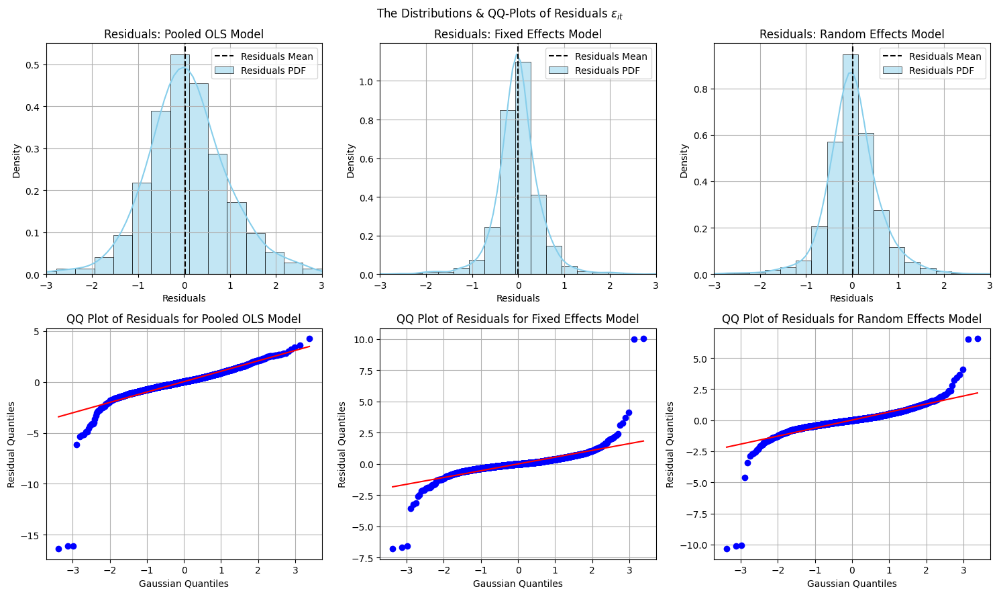

In [82]:
plot_resid_distribution_and_qqplot(residuals_dict,-3,3)

All the models yield residuals with bell curve distributions around zero with the model without Time and Entity effects having the most symetrical residual PDF.

The model with no Time or Entity effects seems to yield the residuals with the quantiles that are closest to gaussian quantiles with some exceptions around the left tail of the distribution. 

In [83]:
def test_and_interpret_residuals_normality(residuals, alpha=0.05):
    """
    Test the normality of residuals using Shapiro-Wilk, Kolmogorov-Smirnov (KS), and Anderson-Darling tests,
    and interpret the results.

    Args:
        residuals (array-like): Array of residuals to test for normality.
        alpha (float): Significance level for hypothesis tests (default: 0.05).

    Returns:
        dict: Dictionary containing test results and interpretations for each normality test.
            Keys:
                - 'shapiro': Interpretation of Shapiro-Wilk test
                - 'ks': Interpretation of Kolmogorov-Smirnov test
                - 'anderson': Interpretation of Anderson-Darling test
    """
    # Shapiro-Wilk Test
    shapiro_stat, shapiro_pval = stats.shapiro(residuals)
    shapiro_interpretation = f"Reject H0 (residuals are not normally distributed)" if shapiro_pval < alpha else f"Accept H0 (residuals are normally distributed)"
    
    # Kolmogorov-Smirnov Test
    ks_stat, ks_pval = stats.kstest(residuals, 'norm')
    ks_interpretation = f"Reject H0 (residuals are not drawn from a normal distribution)" if ks_pval < alpha else f"Accept H0 (residuals are drawn from a normal distribution)"
    
    # Anderson-Darling Test
    ad_stat, ad_critical_vals, _ = stats.anderson(residuals, dist='norm')
    ad_interpretation = f"Reject H0 (residuals do not follow a normal distribution)" if ad_stat > ad_critical_vals[2] else f"Accept H0 (residuals follow the assumed distribution)"
    
    # Interpretation
    test_results = '* Shapiro-Wilk: ' + shapiro_interpretation + f": p-value = {shapiro_pval}\n" + '\n* Kolmogorov-Smirnoff: '+ ks_interpretation + f": p-value = {ks_pval}\n"+'\n* Anderson-Darling: '+ ad_interpretation + f": AD statistic = {ad_stat}\n"
    
    print(test_results)


In [84]:
for key in residuals_dict.keys():
    print('============================= Model =',(key),'=============================\n')
    test_results = test_and_interpret_residuals_normality(residuals_dict[key])

============================= Model = Pooled OLS Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distributed): p-value = 7.483715178192326e-46

* Kolmogorov-Smirnoff: Reject H0 (residuals are not drawn from a normal distribution): p-value = 6.655432118973177e-10

* Anderson-Darling: Reject H0 (residuals do not follow a normal distribution): AD statistic = 43.032578908495

============================= Model = Fixed Effects Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distributed): p-value = 1.5312439231137972e-51

* Kolmogorov-Smirnoff: Reject H0 (residuals are not drawn from a normal distribution): p-value = 4.97420630695569e-78

* Anderson-Darling: Reject H0 (residuals do not follow a normal distribution): AD statistic = 101.1925856134776

============================= Model = Random Effects Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distributed): p

Comparatively, while other model specifications also show significant departures from normality based on these tests, the model with both Entity and Time effects set to False exhibits the closest test results in terms of p-values and AD statistic, emphasizing the deviation from normality in the residuals. 

In [85]:
def plot_resid_acf(residuals_dict):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes = axes.flatten()

    for i, (model_key, residuals) in enumerate(residuals_dict.items()):
      
        plot_acf(residuals, ax=axes[i], lags=np.arange(1,20)) 
        
        axes[i].set_title(f'ACF of Residuals for {model_key}')
        axes[i].set_xlabel('Lag')
        axes[i].set_ylabel('Autocorrelation')
        axes[i].grid(True)
        
    fig.suptitle("The ACF Plots of the Residuals $\epsilon_{it}$")
    plt.tight_layout()
    plt.show()

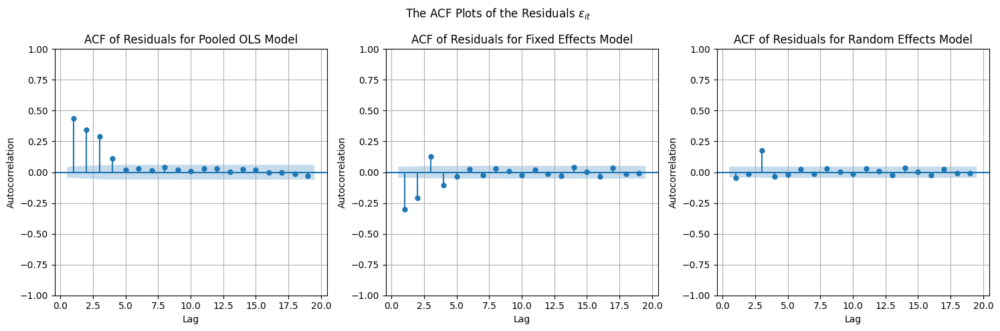

In [86]:
plot_resid_acf(residuals_dict)

* With Entity Effects: The autocorrelation function (ACF) patterns exhibited by the residuals, showing values slightly outside the shaded area across 3 lags before decaying to zero, reveal significant and persistent dependencies within the dataset. The presence of autocorrelation beyond the shaded region at specific lags underscores the consistent and noticeable similarities or patterns between adjacent observations. The alternating signs of these autocorrelation values suggest dynamic fluctuations or cycles inherent in the panel data. The subsequent decay to zero highlights the diminishing influence of these dependencies over time, emphasizing the transient nature of these effects within the panel dataset.

* Without Entity Effects: The ACF behavior observed, where the ACF decays to zero within a short lag window of 3 lags with a waving pattern among those lags (narrowing, widening, then narrowing again), suggests a key insight. The rapid decay to zero within a few lags indicates that nearby observations in the time series exhibit some level of similarity or correlation in their residuals, which dissipates quickly as the lag increases. 

For n > 200, you can test the null hypothesis that there is no autocorrelation by noting that based on this null hypothesis the following test statistic has a standard normal distribution

\begin{equation*}
z = \frac{(2-d)\sqrt{df}}{2} \sim \mathcal{N}(0, 1)
\end{equation*}

where $df = n – k – 1$ (n = sample size and k = # of independent variables) and d is the Durbin-Watson statistic. Thus, if $|z| > \Phi^{-1}\left(1 - \frac{\alpha}{2}\right)$, then you reject the null hypothesis and conclude that there is autocorrelation.

*Source: Lee, M-Y. (2016) On the Durbin Watson statistic based on a Z-test in large samples, Int. J. Computational Economics and Econometrics, Vol. 6, No. 1, pp.114-121.*

In [87]:
def Durbin_Watson(residuals_dict,comparison_table,k,alpha=0.05):
    print("Durbin-Watson Test (n > 200)")
    Abs_Inv_CDF = abs(stats.norm.ppf(alpha/2))
    res = {
        'Model':[],
        'Z-Stat':[],
        'Conclusion':[]
    }
    for key, residuals in residuals_dict.items():
        res['Model'].append(key)
        n = comparison_table.nobs[key]
        df = n - k - 1
        durbin_watson_stat = durbin_watson(residuals)
        z = (2-durbin_watson_stat)*np.sqrt(df)/2
        res['Z-Stat'].append(z)
        if abs(z) > Abs_Inv_CDF:
            res['Conclusion'].append("Autocorrelation is present.")
        else :
            res['Conclusion'].append("No Conclusion")
    return pd.DataFrame(res).set_index('Model')

In [88]:
Durbin_Watson(residuals_dict, comparison_table, X.shape[1])

Durbin-Watson Test (n > 200)


,Z-Stat,Conclusion
Model,,
Pooled OLS Model,19.093920,Autocorrelation is present.
Fixed Effects Model,-13.045101,Autocorrelation is present.
Random Effects Model,-2.045944,Autocorrelation is present.


## 3.2. Deriving the Excess Compensation

In [89]:
model = RandomEffects(Y, X)#,entity_effects=True,time_effects=True)#, entity_effects=False, time_effects=False)
results = model.fit()

panel_data['Expected'] = results.predict(X)
panel_data['Expected Comp'] = np.exp(panel_data['Expected'])
panel_data['Total'] = np.exp(panel_data['Log Total'])
panel_data['Excess'] = panel_data['Total'] - panel_data['Expected Comp']

In [90]:
traces = []
for ticker, data in panel_data.groupby(level='Ticker'):
    trace = go.Scatter(x=data.index.get_level_values('Year'),
                       y=data['Total'],
                       mode='lines',
                       name=ticker)
    traces.append(trace)

layout = go.Layout(title='Total Compensation by Ticker',
                   xaxis=dict(title='Year',
                              tickmode='array',
                              tickvals=data.index.get_level_values('Year').unique(), 
                              ticktext=data.index.get_level_values('Year').unique()), 
                   yaxis=dict(title='Total Compensation'),
                   legend=dict(title='Ticker'))

fig = go.Figure(data=traces, layout=layout)

fig.show()

In [91]:
traces = []
for ticker, data in panel_data.groupby(level='Ticker'):
    trace = go.Scatter(x=data.index.get_level_values('Year'),
                        y=data['Expected Comp'],
                        mode='lines',
                        name=ticker)
    traces.append(trace)

layout = go.Layout(title='Expected Compensation by Ticker',
                   xaxis=dict(title='Year',
                              tickmode='array',
                              tickvals=data.index.get_level_values('Year').unique(),  
                              ticktext=data.index.get_level_values('Year').unique()),  
                   yaxis=dict(title='Expected Compensation'),
                   legend=dict(title='Ticker'))

fig = go.Figure(data=traces, layout=layout)

fig.show()

In [92]:
traces = []
for ticker, data in panel_data.groupby(level='Ticker'):
    trace = go.Scatter(x=data.index.get_level_values('Year'),
                       y=data['Excess'],
                       mode='lines',
                       name=ticker)
    traces.append(trace)

layout = go.Layout(title='Excess Compensation by Ticker',
                   xaxis=dict(title='Year',
                              tickmode='array',
                              tickvals=data.index.get_level_values('Year').unique(), 
                              ticktext=data.index.get_level_values('Year').unique()),  
                   yaxis=dict(title='Excess Compensation'),
                   legend=dict(title='Ticker'))

fig = go.Figure(data=traces, layout=layout)

fig.show()


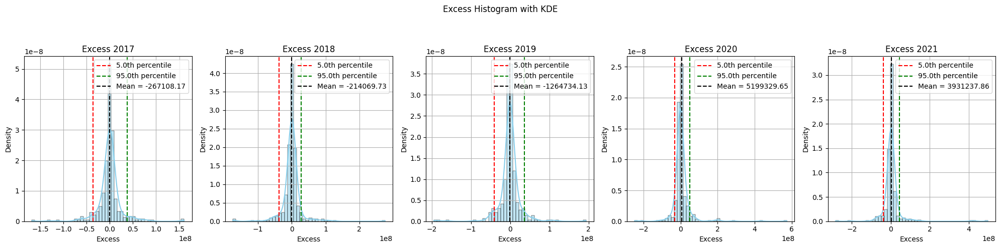

In [93]:
plot_hist_by_year(panel_data.reset_index(),'Excess')

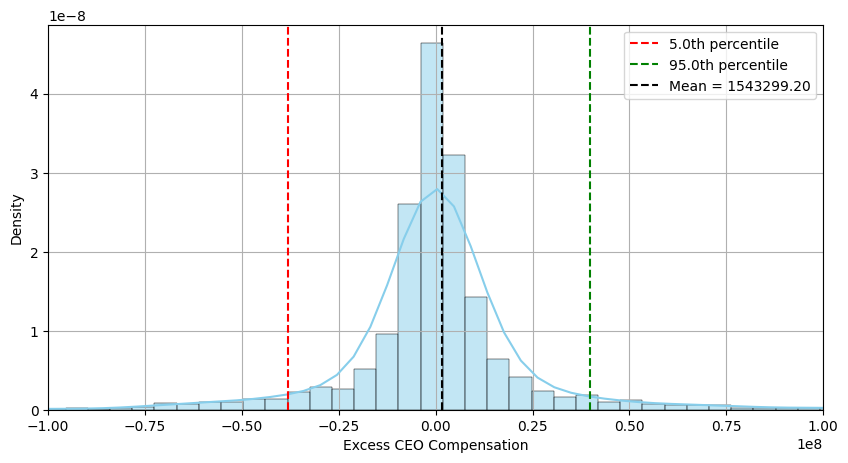

In [94]:
plot_hist(panel_data,'Excess',-1e8,1e8,150,True,'Excess CEO Compensation')

# 4. Deriving the Greenhushing Score $GH_{Score}$

The Greenhushing Score ${GH}_{Score}$ is computed using the following formula: 
\begin{equation*}
	{GH}_{Score}=\alpha.{EG}_{Score}+\beta.{TM}_{Score}+\gamma.{UC}_{Score}
\end{equation*}

\begin{equation*}
	\alpha+\beta+\gamma=1
\end{equation*}

Where:
- ${EG}_{Score}$ is the E (pillar of the ESG) Gap Score between the company at hand and the score benchmark used as ideal score of a company.
- ${TM}_{Score}$ is the Topic Modeling Score quantifying the difference between the relevant topics for the industry set by regulators (SASB) and those disclosed in the “CDP answers data” to the public.
- ${UC}_{Score}$ is the Unelatedness-to-Corpus Score measuring the unrelatedness of the text in the CDP answers data to a corpus of words related to the environmental efforts relative to the SASB Industrial Classification sector of the company.
	
It is worth noting that all these scores will be normalized (ranging between 0 and 1) after computation and one can notice that the Greenhushing Score is a weighted sum that will range from 0 to 1 with 1 indicating total greenhushing behavior and 0 indicating that no deliberate under-communication is detected.

In the following, we will dissect each of the 3 pillars of the Greenhushing Score and explain its contribution in capturing the under-communication behavior in a company.

In [95]:
SP500_SASB.dropna(subset=['Topic'],inplace=True)
GH_Data_List = [
    SP500_ESG_Data, # E score
    CDP_Data # CDP Topics
]
GH_df = pd.merge(SP500_ESG_Data.rename(columns={'Ticker Symbol':'Ticker'}), CDP_Data.rename(columns={'CPD Text Data':'CDP Text Data','Tickers':'Ticker'}), on=['Ticker', 'Year'], how='inner')
GH_df = GH_df[GH_df['Ticker'].isin(SP500_SASB['Ticker Symbol'])]
GH_df['Topic'] = GH_df['Ticker'].apply(lambda tic : ast.literal_eval(SP500_SASB.rename(columns={'Ticker Symbol':'Ticker'})[['Ticker','Topic']][SP500_SASB.rename(columns={'Ticker Symbol':'Ticker'})[['Ticker','Topic']]['Ticker']==tic]['Topic'].values[0]))
#GH_df['SASB Sector'] = GH_df['Ticker'].apply(lambda tic : ast.literal_eval(SP500_SASB.rename(columns={'Ticker Symbol':'Ticker'})[['Ticker','SASB Industry Classification']][SP500_SASB.rename(columns={'Ticker Symbol':'Ticker'})[['Ticker','SASB Industry Classification']]['Ticker']==tic]['SASB Industry Classification'].values[0]))
#GH_df = GH_df[~GH_df['CDP Text Data'].isna()]
#GH_df=GH_df[~GH_df['Ticker'].isin(GH_df[GH_df['CDP Text Data'].isna()]['Ticker'])]

## 4.1. First Pillar: The $EG_{Score}$

The ${EG}_{Score}$, representing the Gap in the E Score, offers one of the pillars of the measure for capturing greenhushing within a company's environmental communication framework. 
It is given by the following formula:
\begin{equation*}
    {EG}_{Score}=max{\left(0,\frac{\bar{E}-E}{\bar{E}}\right)}
\end{equation*}
Where:
- $\bar{E}$ is the desired standard of the E score for all companies.
- $E$ is the company’s actual E score.

It identifies discrepancies between actual environmental performance and the desired standard. By focusing on the right tail of the E score distribution at 10%, the ${EG}_{Score}$ highlights instances where a company falls short of expected levels of transparency and disclosure regarding its environmental practices indicating potential deliberate under-communication behavior. This is explained by the findings of Jianzhuang Zheng et al. (2022) suggesting that green innovation, which can only be identified if the company documents and discloses those initiatives, can significantly enhance ESG scores. Consequently, the ${EG}_{Score}$ can capture a chunk of the greenhushing patterns.


In [96]:
# Compute the mean of the right tail at 10%
def compute_right_mean(column):
    
    valid_values = column.dropna()

    if len(valid_values) == 0:
        return np.nan
    
    sorted_values = np.sort(valid_values)
    
    # Index for the 10th percentile (right tail at 10%)
    quantile_index = int(len(sorted_values) * 0.1)
    
    right_tail_mean = np.mean(sorted_values[-quantile_index:])
    
    return right_tail_mean

In [97]:
column_name = 'Environmental Pillar Score'
mean_right_tail = GH_df.groupby('Year')[column_name].transform(compute_right_mean)

GH_df['E-Gap Score'] = ((mean_right_tail - GH_df[column_name]) / mean_right_tail).apply(lambda x: max(0, x))

GH_df

,Ticker,Company Name,Year,Environmental Pillar Score,CDP Text Data,Bad Performance,Topic,E-Gap Score
0,A,Agilent Technologies Inc,2017,77.109375,Individual Performance Bonuses can be achieved...,0,[Product Design & Lifecycle Management],0.141428
1,A,Agilent Technologies Inc,2018,78.196049,Strategic suppliers and those with greatest en...,0,[Product Design & Lifecycle Management],0.128167
2,A,Agilent Technologies Inc,2019,79.733560,Agilent's Sustainability Committee has the Vic...,0,[Product Design & Lifecycle Management],0.113178
3,A,Agilent Technologies Inc,2020,79.457325,Agilent's Sustainability Committee has the Vic...,0,[Product Design & Lifecycle Management],0.117755
4,A,Agilent Technologies Inc,2021,80.005102,Agilent's Sustainability Committee has the Vic...,0,[Product Design & Lifecycle Management],0.120968
...,...,...,...,...,...,...,...,...
2485,ZTS,Zoetis Inc,2017,20.994092,NaN,-1,[],0.766242
2486,ZTS,Zoetis Inc,2018,38.722673,NaN,-1,[],0.568268
2487,ZTS,Zoetis Inc,2019,54.820574,NaN,-1,[],0.390268
2488,ZTS,Zoetis Inc,2020,56.888883,NaN,-1,[],0.368341


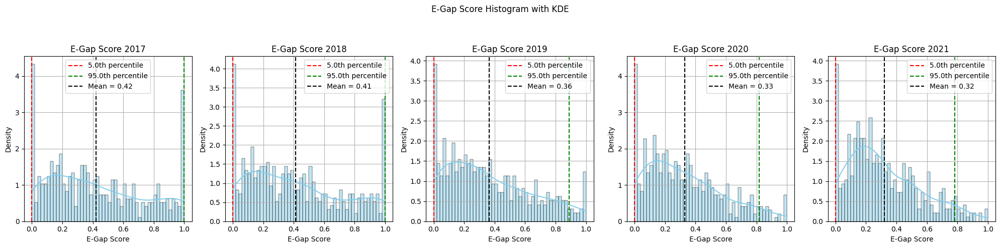

In [98]:
column = 'E-Gap Score'
plot_hist_by_year(GH_df,column)

## 4.2. Second Pillar: The $TM_{Score}$

The Topic Modelling Score, {TM}_{Score}, is the second pillar of our methodology for quantifying and detecting instances of greenhushing within a company's communication channels. Drawing inspiration from X. Font et al. (2016), who pioneered identifying greenhushing by juxtaposing actual green initiatives against communicated messages and actions via a linguistic analysis, this approach focuses on comparing the topics disclosed in the CDP questionnaire with those deemed relevant by SASB for the company’s industrial sector. 

By using Latent Dirichlet Allocation (LDA) for topic modelling, a Natural Language Processing technique, this method identifies and extracts key themes and subjects within documents. It then quantifies the disparity between topics disclosed in CDP answers and the SASB topics for that industry using numerical embedding techniques via Word2Vec’s Continuous Bag of Words (CBoW) model to get their vectorial forms. After that we compute cosine similarity of topics to derive TM_{Score}. The formula for computing the score captures the divergence in topic representation, with a higher score indicating a greater dissonance between official documents and those targeting customers.
 
\begin{equation*}
{TM_{Score}}_{it}=1-TS_{Score_{it}}
\end{equation*}

Where $TS_{Score_{it}}$ is the Topics Similarity Score for company i and year t calculated by embedding topics in vectors all having the same dimensions and then performing cross vectors cosine similarity to quantify similar ones between the two types of documents and average them.

This methodology's strength lies in its ability to uncover instances where green initiatives guided by the compliance with SASB  are omitted or downplayed in communications, and it describes the following process:

1. Extracting topics from CDP answers for each company.
2. Numerically embedding CDP topics and SASB topics.
3. Computing Topic Similarity Score and Topic Modeling Score.


In [99]:
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    # Convert to lowercase and remove non-alphanumeric characters and digits
    text = re.sub(r'\W|\d+', ' ', text.lower())
   
    tokens = word_tokenize(text)
    # Lemmatize the tokens and remove stopwords, words with length < 2 (that don't exist in the stopwords corpus), and words that make no sense (without vowels)
    preprocessed_tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words and len(token)>2 and re.search(r'[aeiou]', token)]
    return preprocessed_tokens

In [100]:
def extract_topics(text):
    if pd.isna(text):
        return np.nan
    
    documents  = text.split('\n')
    Useless = ['nan','','Question not applicable']    
    tokenized_documents = [preprocess_text(doc) for doc in documents if doc not in Useless]
    
    if len(tokenized_documents)>0:
        dictionary = corpora.Dictionary(tokenized_documents)
        corpus = [dictionary.doc2bow(doc) for doc in tokenized_documents]
        topics_num = len(documents)

        lda_model = models.LdaModel(corpus, num_topics=topics_num, id2word=dictionary)
        return lda_model.print_topics(num_words=10)
    return []

In [101]:
def compute_topic_similarity(topic1, topic2):
    """
    Compute the similarity between two topics represented as tuples.

    Parameters:
        topic1 (tuple): Tuple representing the first topic (Disclosed).
        topic2 (tuple): Tuple representing the second topic (SASB).

    Returns:
        float: Similarity percentage between the two topics.
    """
    
    words_topic1 = [value.split("*")[1].strip('" ') for value in topic1.split("+")]
    words_topic2 = [value for value in topic2.split(" ")]
   
    embeddings_topic1 = [w2v_model[word] for word in words_topic1 if word in w2v_model]
    embeddings_topic2 = [w2v_model[word] for word in words_topic2 if word in w2v_model]

    avg_embedding_topic1 = np.mean(embeddings_topic1, axis=0) if embeddings_topic1 else None
    avg_embedding_topic2 = np.mean(embeddings_topic2, axis=0) if embeddings_topic2 else None

    if avg_embedding_topic1 is not None and avg_embedding_topic2 is not None:
        
        similarity = np.dot(avg_embedding_topic1, avg_embedding_topic2) / (np.linalg.norm(avg_embedding_topic1) * np.linalg.norm(avg_embedding_topic2))
    else:
        similarity = 0.0  # Default similarity for empty topics

    return similarity

In [102]:
def compute_topics_modeling_score(text, topics_doc2):
    
    topic_extract = extract_topics(text)

    if not(isinstance(topic_extract, list) and topic_extract):
        return np.nan
    
    topics_doc1 = [t[1] for t in topic_extract] 
    n = len(topics_doc1)
    m = len(topics_doc2)

    if m == 0:
        return 0
    matrix = np.zeros((n, m))

    for i in range(n):
        for j in range(m):
            matrix[i][j] = compute_topic_similarity(topics_doc1[i],topics_doc2[j])

    max_values = np.max(matrix, axis=0)
    average_max = np.mean(max_values)
    
    return 1 - average_max

In [103]:
GH_df['Topic Modeling Score'] = GH_df.apply(lambda row: compute_topics_modeling_score(row['CDP Text Data'], row['Topic']), axis=1)

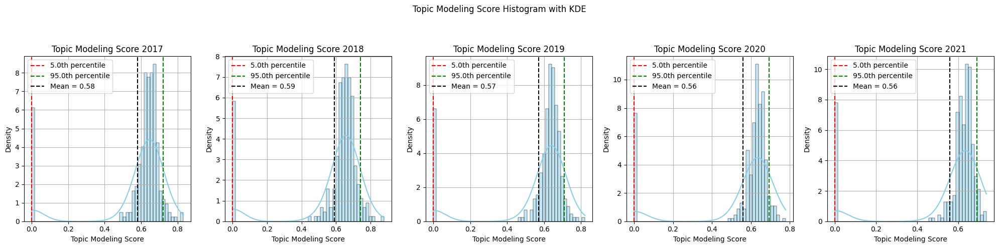

In [104]:
plot_hist_by_year(GH_df,'Topic Modeling Score')

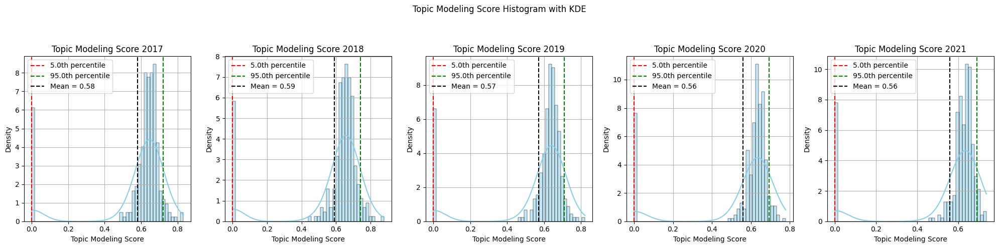

In [105]:
plot_hist_by_year(GH_df[(~GH_df['CDP Text Data'].isna())],'Topic Modeling Score')

## 4.3. Third Pillar: The $UC_{Score}$

The $UC_{Score}$, or Unrelatedness-to-Corpus Score, plays a pivotal role in capturing aspects of greenhushing behavior within the company’s disclosure, again inspired by X. Font et al.’s linguistic analysis. By measuring the alignment of the CDP text to a corpus of environmental sustainability-related words tailored to the company's industry sector, this metric offers insights into the degree to which green initiatives are communicated transparently and comprehensively via word choice. 

Specifically, the $UC_{Score}$ evaluates the absence of sector-specific environmental concerns within the text, providing a quantitative measure of the extent to which the company addresses the disclosure of its initiatives for relevant environmental sustainability issues. It quantifies the proportion of words of the corpus that are absent in the set of keywords (extracted using TF-IDF) of the AI-preprocessed CDP text (Tokenization, Stopwords Elimination, and Non-Alphanumeric Words Filtering):
$$
UC_{Score_{it}}=1-\frac{Card\left(S_{it}\right)}{Card\left(C_i\right)}=\frac{Card\left(C_i\setminus S_{it}\right)}{Card\left(C_i\right)}
S_{it}=\{w\in C_i|w\in K_{it}\}
$$
Where:
- $C_i$ is the corpus of vocabulary containing words related to SASB’s target metrics for the industry of company $i$.
- $K_{it}$ is the set of the treated keywords in the CDP disclosure (constructed using TF-IDF Vectorization) of the company $i$ for year $t$.
- $S_{it}$ is the set of corpus words semantically existing in the CDP text of the company $i$ for year $t$ (identified using a Word Frequency Distribution model FreqDist).


In [106]:
def compute_unrelatedness_score(tic, text):
    if pd.isna(text):
        return np.nan
    corpus_base = [
    'responsibility',
    'environmentally',
    'green',
    'circular',
    'carbon-neutral',
    'systems',
    'efficiency',
    'standards',
    'low-carbon',
    'generation',
    'production',
    'supply',
    'chain',
    'power',
    'mitigation',
    'cities',
    'manufacturing',
    'provider',
    'removal',
    'goals',
    'development',
    'technology',
    'action',
    'transition',
    'business',
    'computing',
    'solar',
    'energy',
    'innovation',
    'conscious',
    'impact',
    'sustainable',
    'low-emission',
    'transportation',
    'practices',
    'policies',
    'electric',
    'carbon',
    'climate',
    'operations',
    'resource',
    'eco-friendly',
    'recycling',
    'friendly',
    'compliance',
    'renewable',
    'design',
    'investments',
    'reduce',
    'footprint',
    'management',
    'wind',
    'regulations',
    'clean',
    'integration',
    'grids',
    'companies',
    'IT',
    'consumption',
    'waste',
    'economy',
    'reduction',
    'efforts',
    'technologies',
    'sector',
    'products',
    'policy',
    'investment',
    'strategies',
    'buildings',
    'vehicles',
    'stewardship',
    'conservation',
    'projects',
    'performance',
    'industry',
    'sources',
    'awareness',
    'initiatives',
    'change',
    'environmental',
    'smart',
    'solutions',
    'emissions'
    ]
    sector = SP500_SASB[SP500_SASB['Ticker Symbol']=='A']['SASB Industry Classification'].values[0]
    corpus = preprocess_text(' '.join(list(set(list(Environmental_Metrics[sector]['TOPIC'].values)+list(Environmental_Metrics[sector]['METRIC'].values)+corpus_base))))
    if len(corpus)==len(list(set(corpus_base))):
        return 0
    Useless = ['nan','','Question not applicable']    
    documents = [' '.join(preprocess_text(doc)) for doc in text.split('\n') if doc not in Useless]
    if len(documents)==0:
        return 1
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(documents)

    num_words = 4
    List_of_keywords = []
    feature_names = vectorizer.get_feature_names_out() 
    for i, doc in enumerate(documents):
        scores = tfidf_matrix[i].toarray().flatten()
        top_indices = scores.argsort()[-num_words:][::-1]  
        top_keywords = [feature_names[idx] for idx in top_indices]
        List_of_keywords += top_keywords

    # Check existing words and their freq
    text_freq_dist = FreqDist(List_of_keywords)

    num_corpus_words = len(set(corpus)) # Unique
    num_corpus_words_in_text = sum(1 for word in set(corpus) if word in text_freq_dist) # Number of words occuring in the text

    # Relatedness
    if num_corpus_words > 0:
        relatedness_score = num_corpus_words_in_text / num_corpus_words 
    else:
        relatedness_score = 0  # If the corpus is empty
    return 1-relatedness_score

In [107]:
GH_df['Unrelatedness to Corpus'] = GH_df.apply(lambda row: compute_unrelatedness_score(row['Ticker'],row['CDP Text Data']), axis=1)

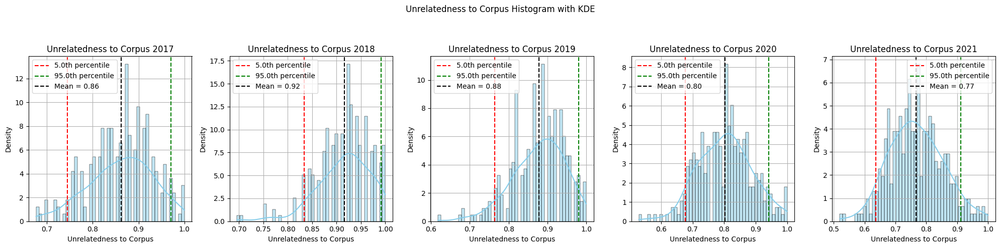

In [108]:
plot_hist_by_year(GH_df[~GH_df['CDP Text Data'].isna()],'Unrelatedness to Corpus')

## 4.4. Deriving the Combined Greenhushing Score $GH_{Score}$

After averaging the three pillars of greenhushing behavior, we derive the Greenhushing Score $GH_{Score}$, which serves as a quantitative measure of the intensity of greenhushing behavior among companies. This metric allows us to assess and compare the extent to which companies are downplaying or underreporting their environmental initiatives and performance.
When analyzing the $GH_{Score}$ distributions over the years, we observe that they predominantly exhibit a bell curve shape. This bell curve distribution suggests that most companies have moderate $GH_{Score}$ values, with fewer companies exhibiting extremely high or low scores.

A significant trend observed is the decline in the average $GH_{Score}$ from 0.59 in 2017 to 0.51 in 2021, which represents an almost 14% drop. This downward trend indicates that, on average, companies have been increasingly transparent about their environmental practices over the years. 

Moreover, we notice a thinning of the right tail of the $GH_{Score}$ distribution over the years. This suggests a decrease in the number of companies with remarkably high $GH_{Score}$, implying that fewer companies are engaging in extreme greenhushing behaviors. This trend may reflect growing pressure from stakeholders for greater environmental transparency and accountability, as well as the increasing importance of sustainability in corporate governance.

In [109]:
GH_df['GH Score'] = GH_df[['E-Gap Score', 'Topic Modeling Score', 'Unrelatedness to Corpus']].mean(axis=1)

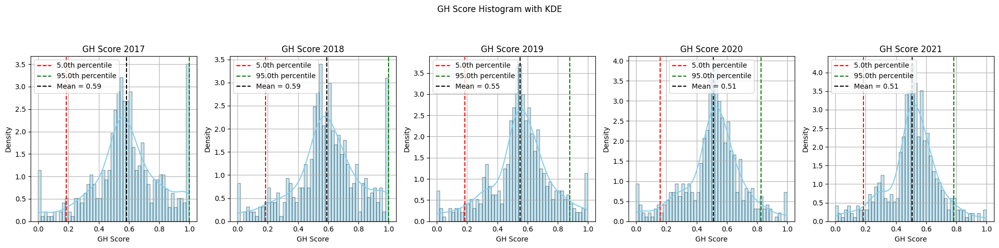

In [110]:
plot_hist_by_year(GH_df,'GH Score')

Another important variable derived from the $GH_{Score}$ is a binary indicator that signifies whether the $GH_{Score}$ exceeds 0.5. This threshold is crucial as it marks the 50% discrepancy level, allowing us to identify instances of significant greenhushing behavior. 

Encouragingly, the trend of the number of companies exhibiting significant greenhushing behavior shows a clear downward trajectory, declining from just under 360 companies in 2017 to a little over 270 companies in 2021 as shown in Figure 17. This decline aligns with the observed decrease in the mean $GH_{Score}$ and the thinning of the distribution's right tail over the years. These trends collectively suggest a reduction in the intensity and prevalence of greenhushing behaviors among companies, reflecting a positive shift towards greater environmental transparency.
 
However, despite this encouraging trend, the fact that over 270 corporations continue to engage in major greenhushing behavior as of 2021 is troubling. This figure emphasizes the persistent problem of establishing full openness in corporate environmental practices, as well as the importance of continuing efforts to encourage and enforce honest reporting by all corporations. The presence of many corporations with considerable greenhushing behavior suggests that, while progress has been made, there is still much space for improvement in corporate sustainability reporting and responsibility.

In [111]:
GH_df['GH Score > 0.5'] = (GH_df['GH Score'] > 0.5).astype(int)

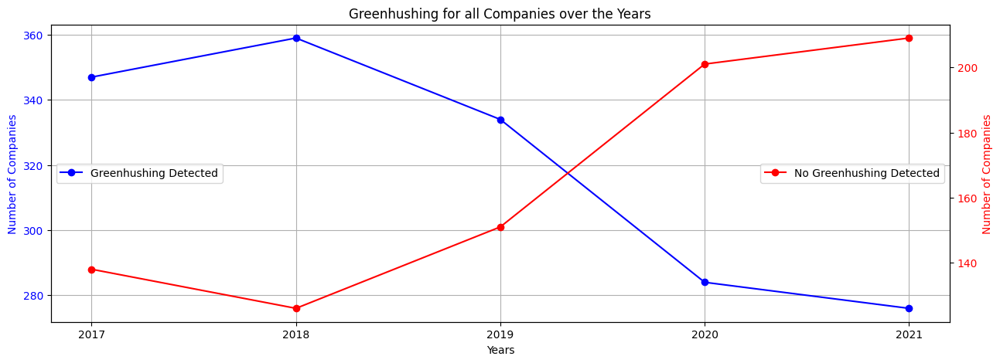

In [112]:
Timestamps = []
GH = []
No_GH = []
for year, frame in GH_df.groupby('Year'):
    Timestamps.append(year)
    GH.append((frame['GH Score > 0.5']==1).sum())
    No_GH.append((frame['GH Score > 0.5']==0).sum())

fig, ax1 = plt.subplots(figsize=(15, 5))

ax1.plot(Timestamps, GH, marker='o', label='Greenhushing Detected', color='b')
ax1.set_xlabel('Years')
ax1.set_ylabel('Number of Companies', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.legend(loc='center left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(Timestamps, No_GH, marker='o', label='No Greenhushing Detected', color='r')
ax2.set_ylabel('Number of Companies', color='r')
ax2.tick_params(axis='y', labelcolor='r')
ax2.legend(loc='center right')

plt.xticks(Timestamps) 
plt.title('Greenhushing for all Companies over the Years')
plt.show()

# 5. Exploring the Relationship Between Greenhushing & Excess Compensation: Econometric Models

In our econometric model, we aim to comprehensively explore the intricate relationship between greenhushing behavior and excess compensation within corporations. By delving into this relationship, we seek to unravel the potential implications of greenhushing on executive pay structures and corporate governance practices.

At the heart of our analysis lies the dependent variable, excess compensation $Xcomp$, which serves as a crucial indicator of the remuneration received by executives beyond what is deemed reasonable or justified. This excess compensation is influenced by a myriad of factors, including the extent of greenhushing behavior exhibited within the organization.

To capture the nuanced nature of greenhushing, we introduce the Greenhushing Score $GH_{score}$ as an independent variable. This score quantifies the degree of greenhushing behavior present within the corporate environment, with a value of 0 indicating no greenhushing and a value of 1 representing total greenhushing. Through this measure, we aim to shed light on how the concealment or downplaying of environmental initiatives may impact executive compensation practices.

Furthermore, we include the internal governance $GOV_{𝑖𝑡}$ of firms using proxies represented by Board Size $BS$ and Board Independence $BI$ which is the proportion of the independent directors. These governance variables provide insights into the composition and independence of the board of directors, offering valuable context for understanding the dynamics at play within the organization.

$$
GOV_{𝑖𝑡} = \begin{pmatrix} BS_{it} \\ BI_{it} \end{pmatrix}
$$

The same Economic determinants $ED$ mentioned earlier in the estimation of the dependent variable are also incorporated into our model. These variables serve as proxies for firm performance and growth opportunities, which may influence executive compensation decisions.

$$
ED_{it} = \begin{pmatrix} B2M_{it}\\ ln(Tenure)_{it} \\ ln(Sales)_{it-1}\\ RET_{it}\\RET_{it-1}\\ ROA_{it}\\ROA_{it-1} \end{pmatrix}
$$

Additionally, we consider the CEOs’ Power Status $CEOchar_{𝑖𝑡}$ which is an indicator of the CEO’s power position within the company made of two binary variables indicating whether the CEO was a past employee $Power1_{it}$ at the company and if he is a board member or not $Power2_{it}$. This aspect of the model allows us to explore how the power dynamics within corporations may interact with greenhushing behavior to shape executive pay structures.

$$
CEOchar_{𝑖𝑡} = \begin{pmatrix} Power1_{it} \\ Power2_{it} \end{pmatrix}
$$

Utilizing a linear regression framework, we formulate two distinct models to probe the relationship between greenhushing and excess compensation. 

In [145]:
def winsorize_series(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    return series.clip(lower=lower_limit, upper=upper_limit)

In [169]:
def standard_scale_by_year(df):
    """
    Standard scales the columns of a DataFrame grouped by 'Year' in a multi-index ['Ticker', 'Year'].
    
    Parameters:
    df (pd.DataFrame): The input DataFrame with a multi-index ['Ticker', 'Year'].
    
    Returns:
    pd.DataFrame: The DataFrame with standard scaled columns.
    """
    scaler = MinMaxScaler()
    
    years = df.index.get_level_values('Year').unique()
    
    scaled_dfs = []
    
    for year in years:
        df_year = df.xs(year, level='Year')
        scaled_data = scaler.fit_transform(df_year)
        scaled_df_year = pd.DataFrame(scaled_data, index=df_year.index, columns=df_year.columns)
        scaled_df_year['Year'] = year
        scaled_df_year.set_index('Year', append=True, inplace=True)
        scaled_dfs.append(scaled_df_year)
    
    scaled_df = pd.concat(scaled_dfs).sort_index()
    
    return scaled_df

In [216]:
def pearson_corr_with_significance(df):
    def calculate_corr_pvalues(df):
        cols = df.columns
        corr_matrix = pd.DataFrame(index=cols, columns=cols)
        pval_matrix = pd.DataFrame(index=cols, columns=cols)

        for col1 in cols:
            for col2 in cols:
                if col1 == col2:
                    corr_matrix[col1][col2] = 1.0
                    pval_matrix[col1][col2] = np.nan
                else:
                    corr, pval = stats.pearsonr(df[col1], df[col2])
                    corr_matrix[col1][col2] = corr
                    pval_matrix[col1][col2] = pval

        return corr_matrix, pval_matrix

    corr_matrix, pval_matrix = calculate_corr_pvalues(df)

    def pval_to_stars(pval):
        if pval < 0.01:
            return '***'
        elif pval < 0.05:
            return '**'
        elif pval < 0.10:
            return '*'
        else:
            return ''

    formatted_corr = corr_matrix.copy()

    for col1 in corr_matrix.columns:
        for col2 in corr_matrix.columns:
            if col1 != col2:
                stars = pval_to_stars(pval_matrix.loc[col1, col2])
                formatted_corr.loc[col1, col2] = f'{corr_matrix.loc[col1, col2]:.2f}{stars}'
            else:
                formatted_corr.loc[col1, col2] = f'{corr_matrix.loc[col1, col2]:.2f}'

    return formatted_corr

In [226]:
def summary_descriptive_stats(df):
    """
    Calculate the summary of descriptive statistics for a DataFrame.
    
    Args:
    df (pd.DataFrame): The input DataFrame.
    
    Returns:
    pd.DataFrame: A DataFrame with columns: mean, median, std, and number of observations.
    """
    desc_stats = pd.DataFrame({
        'Mean': df.mean(),
        'Median': df.median(),
        'Standard Deviation': df.std(),
        'Number of Observations': df.count()
    })
    
    return desc_stats.round(2)

In [218]:
labs = [
 '$B2M_{it}$',
 '$ln(Tenure)_{it}$',
 '$ln(Sales)_{it-1}$',
 '$RET_{it}$',
 '$RET_{it-1}$',
 '$ROA_{it}$',
 '$ROA_{it-1}$',
 '$Xcomp_{it}$',
 '${{\mathbb{1}_{{GHscore}>0.5}}}_{it}$',
 '${GH_{Score}}_{it}$',
 '$BS_{it}$',
 '$BI_{it}$',
 '$Power1_{it}$',
 '$Power2_{it}$'
]

In [228]:
# Data Merging
Comp_Year = ['Ticker', 'Year']
CEO_Char = ['CEO Past Employee', 'CEO Board Member']
Gov = ['Board Size', 'Board Independence']
ED = ['B2M', 'Log Tenure', 'Log Lagged Sales', 'RET', 'Lagged RET', 'ROA', 'Lagged ROA']
X_Comp = 'Excess'
Sector = ['SIC']
GH_Existence = ['GH Score > 0.5']
GH_Severity = ['GH Score']

List = [panel_data.reset_index()[Comp_Year + ED + Sector + [X_Comp]],GH_df[Comp_Year + GH_Existence + GH_Severity],Board_Data.rename(columns={'Ticker Symbol':'Ticker','Independent Board Members':'Board Independence'})[Comp_Year + Gov],CEO_Power.rename(columns={'Ticker Symbol':'Ticker'})[Comp_Year + CEO_Char]]

Data = List[0]
for df in List[1:]:
    Data = pd.merge(Data, df, on=['Ticker', 'Year'], how='inner')

Data.set_index(Comp_Year,inplace=True)

desc_stats_df = summary_descriptive_stats(Data.drop(columns=['SIC']))
display(desc_stats_df)
desc_stats_df.index = labs
desc_stats_df.to_excel('summary_descriptive_stats.xlsx', sheet_name='Summary')

Data = Data.dropna()

# Data Cleaning: IQR Winsorization
for col in GH_Severity+[X_Comp]+ED+Gov:
    Data[col] = Data.groupby('Year')[col].transform(winsorize_series)

Data[GH_Severity+[X_Comp]+ED+Gov] = standard_scale_by_year(Data[GH_Severity+[X_Comp]+ED+Gov])
Data.to_excel('Final Sample.xlsx',index=False)

,Mean,Median,Standard Deviation,Number of Observations
B2M,0.39,0.27,0.37,1865
Log Tenure,1.63,1.74,0.93,1865
Log Lagged Sales,23.10,23.04,1.26,1865
RET,0.12,0.11,0.29,1865
Lagged RET,0.12,0.13,0.28,1865
ROA,0.14,0.13,0.09,1865
Lagged ROA,0.14,0.13,0.09,1865
Excess,2023548.17,155355.03,38884701.95,1865
GH Score > 0.5,0.70,1.00,0.46,1865
GH Score,0.57,0.56,0.18,1865


In [220]:
corr_table = pearson_corr_with_significance(Data.drop(columns=['SIC']))
display(corr_table)
corr_table.index = labs
corr_table.columns = labs
corr_table.to_excel('pearson_correlation_final_sample.xlsx', sheet_name='Correlation')

,B2M,Log Tenure,Log Lagged Sales,RET,Lagged RET,ROA,Lagged ROA,Excess,GH Score > 0.5,GH Score,Board Size,Board Independence,CEO Past Employee,CEO Board Member
B2M,1.00,-0.08***,0.27***,-0.32***,-0.29***,-0.58***,-0.54***,-0.15***,-0.03,-0.11***,0.27***,0.05**,-0.01,-0.03
Log Tenure,-0.08***,1.00,-0.11***,0.05**,0.07***,0.02,0.02,0.09***,0.04*,0.10***,-0.10***,0.05**,0.22***,0.03
Log Lagged Sales,0.27***,-0.11***,1.00,-0.23***,-0.20***,-0.16***,-0.13***,-0.59***,-0.19***,-0.36***,0.42***,0.14***,0.05**,-0.04*
RET,-0.32***,0.05**,-0.23***,1.00,0.04,0.21***,0.10***,0.12***,0.06***,0.11***,-0.20***,-0.04*,-0.00,0.03
Lagged RET,-0.29***,0.07***,-0.20***,0.04,1.00,0.21***,0.14***,0.13***,0.04*,0.08***,-0.16***,-0.00,-0.00,0.03
ROA,-0.58***,0.02,-0.16***,0.21***,0.21***,1.00,0.87***,0.08***,0.00,0.03,-0.26***,-0.14***,0.08***,-0.05**
Lagged ROA,-0.54***,0.02,-0.13***,0.10***,0.14***,0.87***,1.00,0.06**,-0.01,0.02,-0.22***,-0.15***,0.09***,-0.04*
Excess,-0.15***,0.09***,-0.59***,0.12***,0.13***,0.08***,0.06**,1.00,0.11***,0.18***,-0.20***,-0.11***,0.02,0.00
GH Score > 0.5,-0.03,0.04*,-0.19***,0.06***,0.04*,0.00,-0.01,0.11***,1.00,0.72***,-0.06**,-0.07***,0.03,-0.03
GH Score,-0.11***,0.10***,-0.36***,0.11***,0.08***,0.03,0.02,0.18***,0.72***,1.00,-0.19***,-0.15***,-0.00,-0.09***


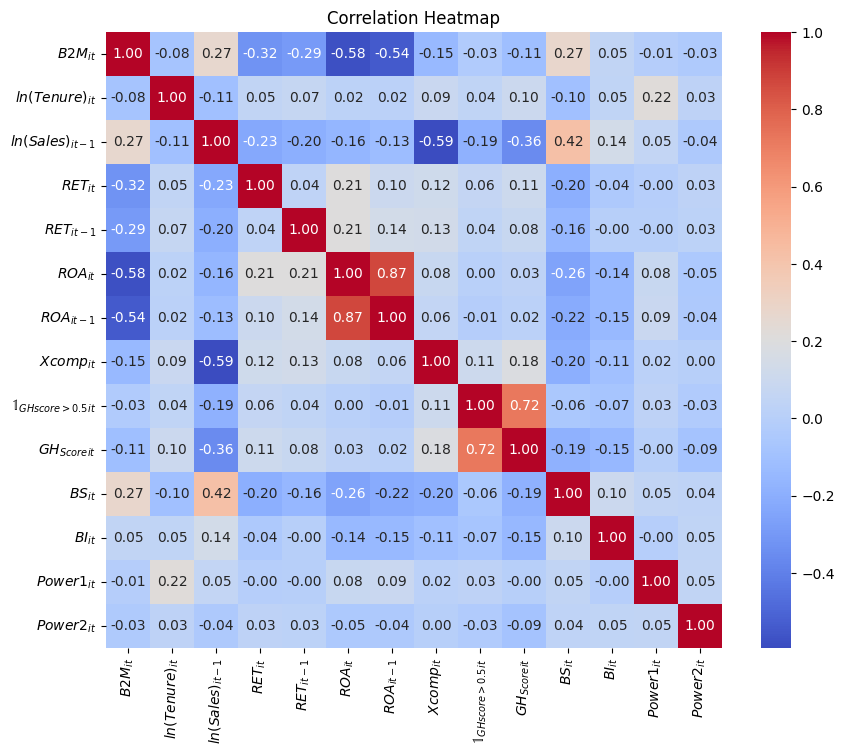

In [193]:
correlation_matrix = Data.drop(columns=['SIC']).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f",square=True,xticklabels=labs,yticklabels=labs)
plt.title('Correlation Heatmap')
plt.show()

## 5.1. The First Model: Studying the Impact of Existence of Greenhushing

The first model, expressed as:

$$
Xcomp_{it}=\beta_0+\beta_1.{\mathbb{1}_{{GHscore}>0.5}}_{it}+\beta_2.GOV_{𝑖𝑡}+ \beta_3.𝐸𝐷_{𝑖t}+\beta_4.CEOchar_{𝑖𝑡} + \epsilon_{it}
$$

investigates the impact of the presence of greenhushing behavior on excess compensation. Here, $Xcomp$ represents excess compensation, $\mathbb{1}_{{GHscore}>0.5}$  denotes the presence of greenhushing behavior, $GOV_{𝑖𝑡}$ represents internal governance proxies, $ED_{𝑖t}$ encompasses economic determinants, $CEOchar_{𝑖𝑡}$ indicates CEOs' power status and $\epsilon_{it}$ is the error term.

In [194]:
y = Data[X_Comp]
X = Data[GH_Existence + Gov + ED + CEO_Char]
hausman_test(y, X)

,Hausman Test
Statistic,128.572003
P-Value,0.0
Conclusion,Fixed Effects


In [195]:
comparison_table1, residuals_dict1, metrics_df1 = model_fit(y, X, 'Excess GH1')

## 5.2. The Second Model: Studying the Impact of Severity of Greenhushing

The second model, expressed as:

$$
Xcomp_{it}=\beta_0+\beta_1.{GHscore}_{it}+\beta_2.GOV_{𝑖𝑡}+ \beta_3.𝐸𝐷_{𝑖t}+\beta_4.CEOchar_{𝑖𝑡} + \epsilon_{it}
$$

studies the extent of greenhushing behavior and its influence on executive pay. In this model, $GHscore_{it}$ quantifies the intensity of greenhushing behavior, while the remaining variables retain their previous definitions. Through these models, we aim to elucidate the intricate relationship between greenhushing behavior and excess compensation within corporate settings.

In [196]:
y = Data[X_Comp]
X = Data[GH_Severity + Gov + ED + CEO_Char]
hausman_test(y, X)

,Hausman Test
Statistic,129.017274
P-Value,0.0
Conclusion,Fixed Effects


In [197]:
comparison_table2, residuals_dict2, metrics_df2 = model_fit(y, X, 'Excess GH2')

# 6. Results & Analysis

## 6.1. The Hypothesis of this Work

Before we analyse the results we start with a reminder of the hypothesis developed in this paper:

***H1 and H2: Greenhushing, Disclosure, and Excess Compensation***

Greenhushing highlights the risk of backlash associated with the disclosure of green initiatives, especially when companies fail to meet their sustainability goals, leading to negative attention and accusations of hypocrisy. This reputation risk, often attributed to CEOs who are risk-averse, prioritizes career considerations as noted by Hirshleifer and Thakor (1992). To mitigate this risk, CEOs may seek excess compensation as a buffer against potential career damage. Conversely, if a company is guilty of greenhushing, its reputation may suffer due to non-transparent communication, fueling skepticism about its credibility. Here again, the reputation risk falls on the executives, including the CEO, who might seek excess compensation as a risk management strategy. Thus, in both scenarios—whether greenhushing occurs or not—CEOs may pursue excess compensation to safeguard their position. Therefore, our primary hypotheses are:

*Hypothesis 1:* Greenhushing does not drive excess executive compensation.

*Hypothesis 2a:* The greenhushing behavior positively impacts excess compensation.

*Hypothesis 2b:* The greenhushing behavior negatively impacts excess compensation.

***H3: Internal Governance and Excess Compensation***

Strong internal governance mechanisms, exemplified by a smaller board size (Jensen, 1993) and higher board independence (Shams Pathan, 2009), are expected to exert greater oversight and constraints on executive compensation practices. This leads us to hypothesize:

*Hypothesis 3:* Stronger internal governance, represented by a smaller board size and higher board independence, has a negative impact on excess compensation.

***H4: CEO’s Power Status***

The CEO’s power status, which includes their level of influence within the organization, can significantly affect executive compensation decisions. Greater CEO power may exacerbate the link between greenhushing behavior and excessive executive pay. Therefore, we hypothesize:

*Hypothesis 4:* Greater CEO power status strengthens the relationship between greenhushing behavior and excess executive compensation.

These hypotheses collectively address the dynamic interactions between greenhushing practices, internal governance mechanisms, and the movements of executive compensation, providing a broader framework for understanding how these elements interplay within corporate environments.


## 6.2. The First Model: Studying the Impact of Existence of Greenhushing

The econometric results of linking excess CEO compensation and the existence of greenhushing behavior reveal nuanced insights as displayed in Table 3, highlighting the dynamic interplay of several numerical figures in that relationship. This analysis incorporates three primary models: the Pooled OLS, Fixed Effects, and Random Effects models.

In [198]:
comparison_table1

,Pooled OLS Model,Fixed Effects Model,Random Effects Model
Dep. Variable,Excess,Excess,Excess
Estimator,PooledOLS,PanelOLS,RandomEffects
No. Observations,1841,1841,1841
Cov. Est.,Unadjusted,Unadjusted,Unadjusted
R-squared,0.8473,0.0146,0.6506
R-Squared (Within),-0.0815,0.0146,-0.0553
R-Squared (Between),0.9052,-0.7858,0.9015
R-Squared (Overall),0.8473,-0.7409,0.8448
F-statistic,845.72,1.7722,283.75
P-value (F-stat),0.0000,0.0478,0.0000


In the Pooled OLS model, several significant insights emerge. Firstly, the existence of greenhushing positively impacts excess CEO compensation, with the coefficient significant at the 1% level. This finding supports Hypothesis 2a, suggesting that greenhushing behavior drives higher excess compensation, thereby rejecting Hypothesis 1, which posits no relationship. Furthermore, internal governance, specifically Board Independence (measured by whether the CEO is also a board member), significantly and positively impacts excess compensation at the 1% level, opposing Hypothesis 3, which anticipated a negative impact. However, board size is not significant. Additionally, the CEO power status variable, indicating the CEO's role as a board member (Power2), significantly and positively impacts excess compensation, confirming Hypothesis 4. Moreover, the economic determinant of lagged sales shows a significant negative impact on excess compensation at the 1% level and positively impacts it through the logarithm of tenure at 1%, with return and its first lag significant at 1%, but ROA and its first lag are insignificant. This adds another layer of complexity to the analysis.

On the other hand, the Fixed Effects model presents a distinct perspective. In this model, greenhushing is not a significant predictor of excess CEO compensation. This result rejects Hypotheses 2a and 2b and confirms Hypothesis 1, suggesting that greenhushing behavior does not influence excess compensation. Additionally, internal governance variables, including board size and board independence, are not significant in this model, leading to the rejection of Hypothesis 3. Similarly, CEO power status variables are also not significant, rejecting Hypothesis 4. However, it is noteworthy that several economic determinants significantly impact excess compensation: the logarithm of tenure negatively impacts it at the 10% level, and stock returns and their first lag negatively impact it at the 1% level. These findings underscore the importance of considering economic factors when analyzing CEO compensation.

Meanwhile, the Random Effects model shows results similar to the Fixed Effects model regarding the insignificance of greenhushing existence. Consequently, this model also rejects Hypotheses 2a and 2b and confirms Hypothesis 1. For internal governance variables, Board Independence once again shows a significant positive impact on excess compensation at the 1% level, contradicting Hypothesis 3, while board size remains insignificant. Additionally, CEO power status, particularly the Power2 variable, significantly and positively impacts excess compensation at the 1% level, thereby confirming Hypothesis 4. Furthermore, economic determinants show that the logarithm of lagged sales negatively impacts excess compensation at the 1% level and positively impacts it through the first lag of stock returns at the 5% level. Thus, the Random Effects model reinforces the complexity observed in the other models.


In [199]:
residuals_df1 = pd.DataFrame({y.name: y})
for key, residuals in residuals_dict1.items():
    residuals_df1[key] = residuals.values

In evaluating the relationship between excess executive compensation and the binary presence of greenhushing, the residual analysis and goodness of fit provide critical insights into the model performances. According to the Fischer test at the 5% significance level, the Fixed Effects model is not globally significant, whereas the Pooled OLS and Random Effects models are significant. This indicates that the Pooled OLS and Random Effects models provide a better overall fit compared to the Fixed Effects model.

All three models—Pooled OLS, Fixed Effects, and Random Effects—exhibit some linear correlation between the residuals and the dependent variable, excess compensation. The distribution of residuals for all three models is not normal, as evidenced by the Shapiro-Wilk, Anderson-Darling, and Kolmogorov-Smirnov tests. These tests indicate that the residuals revolve around means that are relatively close to zero. The Q-Q plots reveal that the Pooled OLS model yields residuals with quantiles closest to normal distribution, followed by the Random Effects model, and then the Fixed Effects model. This normality proximity in residuals further supports the robustness of the Pooled OLS model.

Analyzing the autocorrelation function of residuals, both the Fixed Effects and Pooled OLS models exhibit autocorrelation, with positive autocorrelation in the Pooled OLS model and negative autocorrelation in the Fixed Effects model. These findings are confirmed by the Durbin-Watson test variant for large samples. For the Random Effects model, the test is indecisive; however, the ACF plot indicates no observable autocorrelation.


In [230]:
plot_resid_vs_dep(y.name, residuals_df1)

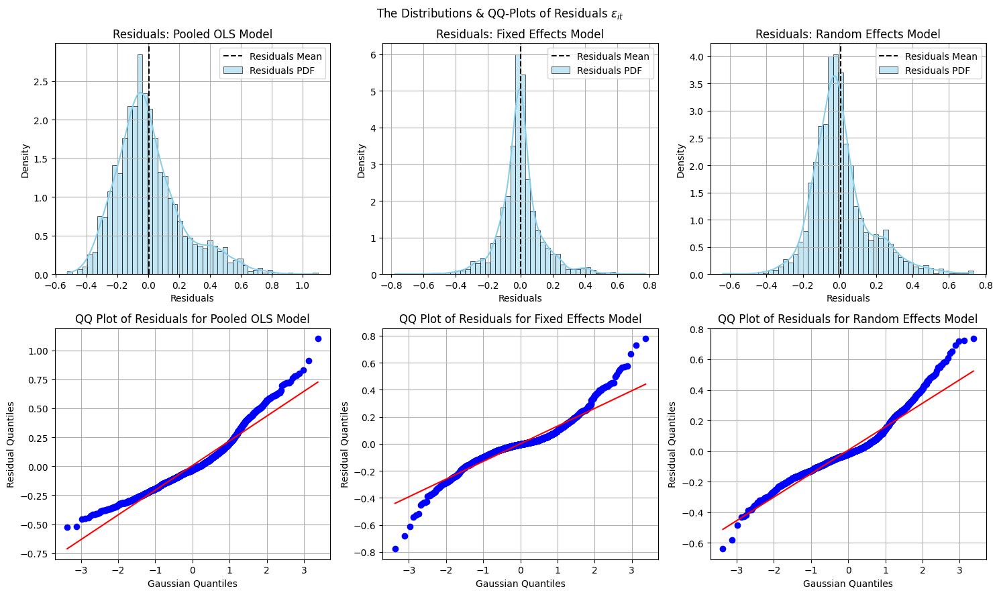

In [201]:
plot_resid_distribution_and_qqplot(residuals_dict1)#,-1e8, 1e8,bins=500)

In [202]:
for key in residuals_dict1.keys():
    print('============================= Model :',key,'=============================\n')
    test_results = test_and_interpret_residuals_normality(residuals_dict1[key])

============================= Model : Pooled OLS Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distributed): p-value = 3.8595529508221614e-25

* Kolmogorov-Smirnoff: Reject H0 (residuals are not drawn from a normal distribution): p-value = 4.4813507928911e-200

* Anderson-Darling: Reject H0 (residuals do not follow a normal distribution): AD statistic = 28.26701771912849

============================= Model : Fixed Effects Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distributed): p-value = 8.782397468803761e-30

* Kolmogorov-Smirnoff: Reject H0 (residuals are not drawn from a normal distribution): p-value = 1.6714156402367528e-223

* Anderson-Darling: Reject H0 (residuals do not follow a normal distribution): AD statistic = 44.61486444611296

============================= Model : Random Effects Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distributed

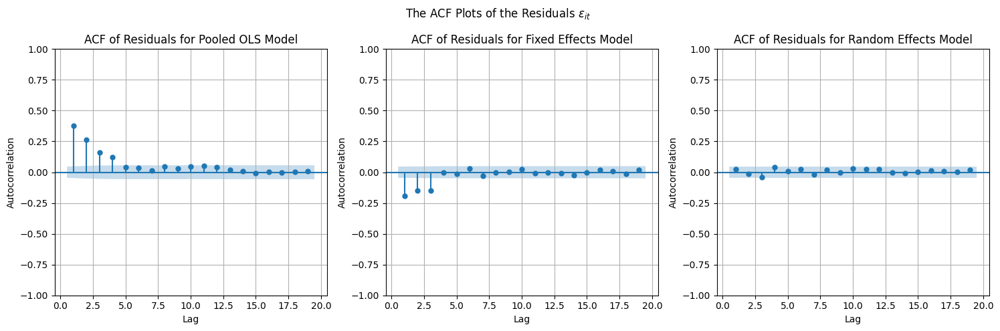

In [231]:
plot_resid_acf(residuals_dict1)

In [204]:
Durbin_Watson(residuals_dict1, comparison_table1, X.shape[1])

Durbin-Watson Test (n > 200)


,Z-Stat,Conclusion
Model,,
Pooled OLS Model,16.241294,Autocorrelation is present.
Fixed Effects Model,-8.243494,Autocorrelation is present.
Random Effects Model,1.048094,No Conclusion


In [205]:
metrics_df1

,Pooled OLS Model,Fixed Effects Model,Random Effects Model
Log Likelihood,186.15,1059.5**,782.01
BIC,-282.09,-2028.78*,-1473.81
AIC,-348.3,-2095.0*,-1540.02
sMAPE,0.55,2.0,0.54*


When comparing model fit metrics, the Pooled OLS, Fixed Effects, and Random Effects models have closely aligned Log-Likelihood, AIC, BIC values. However, the Pooled OLS model stands out by minimizing the Symmetric Mean Absolute Percentage Error, suggesting superior predictive accuracy.

## 6.3. The First Model: Studying the Impact of Intensity of Greenhushing

Similar to the previous subsection, we analyze the econometric findings of linking excess CEO compensation to the intensity of greenhushing. This analysis also involves the same three primary models: the Pooled OLS, Fixed Effects, and Random Effects models, each offering unique perspectives.

In [206]:
comparison_table2

,Pooled OLS Model,Fixed Effects Model,Random Effects Model
Dep. Variable,Excess,Excess,Excess
Estimator,PooledOLS,PanelOLS,RandomEffects
No. Observations,1841,1841,1841
Cov. Est.,Unadjusted,Unadjusted,Unadjusted
R-squared,0.8479,0.0167,0.6515
R-Squared (Within),-0.0779,0.0167,-0.0552
R-Squared (Between),0.9057,-0.9379,0.9024
R-Squared (Overall),0.8479,-0.8853,0.8457
F-statistic,849.90,2.0338,284.95
P-value (F-stat),0.0000,0.0186,0.0000


In the Pooled OLS model, several significant relationships emerge. Firstly, the intensity of greenhushing has a positive and significant impact on excess CEO compensation at the 1% level. This result confirms Hypothesis 2a, indicating that greater greenhushing intensity drives higher excess compensation, thereby rejecting Hypothesis 1, which posits no relationship. Furthermore, internal governance factors play a crucial role, with Board Independence significantly and positively impacting excess compensation at the 1% level, measured by whether the CEO is also a board member. This finding contradicts Hypothesis 3, which anticipated a negative impact. However, board size does not show a significant effect. Additionally, the CEO power status variable, particularly the indicator of the CEO being a board member Power2, significantly and positively impacts excess compensation at the 1% level, confirming Hypothesis 4. Moreover, economic determinants reveal that lagged sales negatively affect excess compensation at the 1% level and positively affect it through the logarithm of tenure at the 5% level, with return and its first lag significant at 1%, but ROA and its first lag are insignificant. This adds an additional layer of complexity to the model.

Conversely, the Fixed Effects model presents a different scenario. Here, the intensity of greenhushing negatively impacts excess CEO compensation, with the coefficient significant at the 1% level. This finding supports Hypothesis 2b, suggesting that higher greenhushing intensity leads to lower excess compensation, thereby rejecting Hypothesis 1. Additionally, governance variables, including board size and board independence, are not significant, leading to the rejection of Hypothesis 3. Similarly, CEO power status variables are also not significant, rejecting Hypothesis 4. Nevertheless, several economic determinants significantly impact excess compensation: the logarithm of tenure negatively impacts it at the 10% level, and the first lag of stock returns negatively impacts it at the 1% level. These findings underscore the importance of considering economic factors when analyzing CEO compensation.

Meanwhile, the Random Effects model offers insights consistent with the Pooled OLS model regarding the positive impact of greenhushing intensity on excess CEO compensation. In this model, greenhushing intensity is significant at the 10% level, again confirming Hypothesis 2a and rejecting Hypothesis 1. Internal governance factors show that Board Independence significantly and positively impacts excess compensation at the 1% level, contradicting Hypothesis 3, while board size remains insignificant. Additionally, the CEO power status, particularly the Power2 variable, significantly and positively impacts excess compensation at the 1% level, confirming Hypothesis 4. Furthermore, economic determinants show that the logarithm of lagged sales negatively impacts excess compensation at the 1% level and positively through the first lag of stock returns at the 5% level. Thus, the Random Effects model reinforces the complexity observed in the other models.


In [207]:
residuals_df2 = pd.DataFrame({y.name: y})
for key, residuals in residuals_dict2.items():
    residuals_df2[key] = residuals.values

When investigating the association between excess executive salary and the degree of greenhushing, residual analysis and goodness of fit demonstrate the efficacy of several models. At the 5% significance level, the Fischer test indicates that the Pooled OLS, Random Effects, and Fixed Effects models are all globally significant. This suggests that each model gives a good match for the data in this case.
All three models—Pooled OLS, Fixed Effects, and Random Effects—show a linear relationship between the residuals and the dependent variable, excess compensation.
  
Figure 22: Distributions & Q-Q Plots of Residuals for the Second Model of Excess Compensation and Greenhushing
The Shapiro-Wilk, Anderson-Darling, and Kolmogorov-Smirnov tests show that the residual distributions in all three models are not normal. These tests demonstrate that the residuals are clustered around values close to zero. The Q-Q plots show that the Pooled OLS model produces residuals with quantiles closest to a normal distribution, followed by the Random Effects and Fixed Effects models. This implies that the Pooled OLS model provides the best approximation of normal residuals of the three.

When examining the autocorrelation function of residuals, both the Fixed Effects and Pooled OLS models show autocorrelation—positive in the Pooled OLS model and negative in the Fixed Effects model. The Durbin-Watson test variation for large samples provides support for these findings. For the Random Effects model, the test results are indecisive, but the ACF plot indicates no observable autocorrelation.


In [208]:
plot_resid_vs_dep(y.name,residuals_df2)

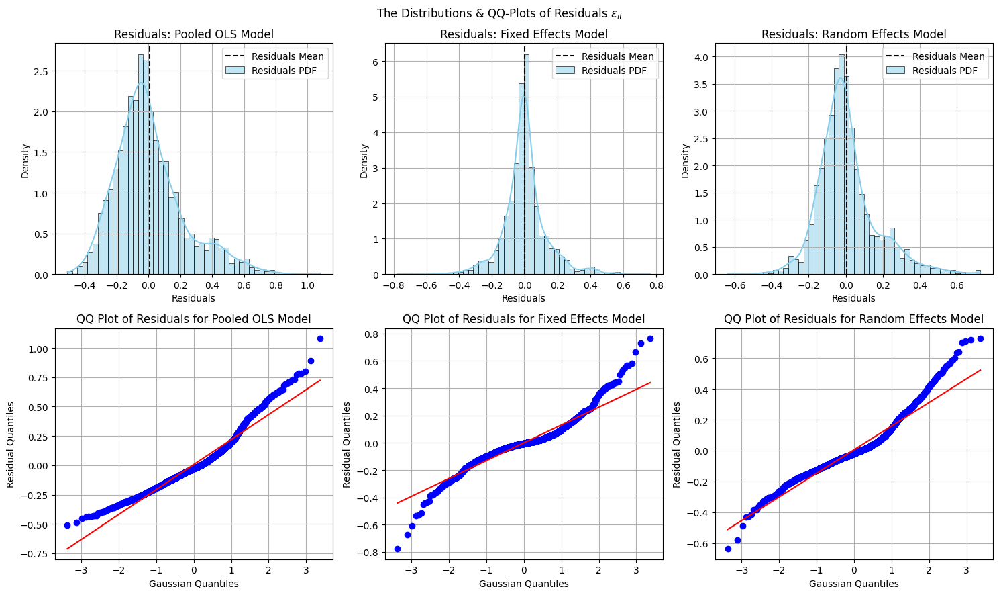

In [209]:
plot_resid_distribution_and_qqplot(residuals_dict2)#,-1e8, 1e8,bins=500)

In [210]:
for key in residuals_dict2.keys():
    print('============================= Model :',key,'=============================\n')
    test_results = test_and_interpret_residuals_normality(residuals_dict2[key])

============================= Model : Pooled OLS Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distributed): p-value = 7.207013934699006e-25

* Kolmogorov-Smirnoff: Reject H0 (residuals are not drawn from a normal distribution): p-value = 3.622384515981956e-197

* Anderson-Darling: Reject H0 (residuals do not follow a normal distribution): AD statistic = 27.58031120213286

============================= Model : Fixed Effects Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distributed): p-value = 1.1440456356369273e-29

* Kolmogorov-Smirnoff: Reject H0 (residuals are not drawn from a normal distribution): p-value = 1.446036139424471e-223

* Anderson-Darling: Reject H0 (residuals do not follow a normal distribution): AD statistic = 44.14128004201484

============================= Model : Random Effects Model =============================

* Shapiro-Wilk: Reject H0 (residuals are not normally distribute

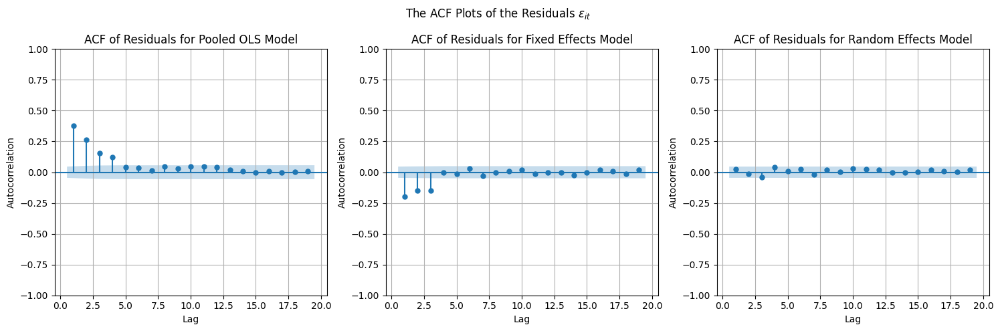

In [211]:
plot_resid_acf(residuals_dict2)

In [212]:
Durbin_Watson(residuals_dict2, comparison_table2, X.shape[1])

Durbin-Watson Test (n > 200)


,Z-Stat,Conclusion
Model,,
Pooled OLS Model,16.284967,Autocorrelation is present.
Fixed Effects Model,-8.382466,Autocorrelation is present.
Random Effects Model,1.101592,No Conclusion


In [213]:
metrics_df2

,Pooled OLS Model,Fixed Effects Model,Random Effects Model
Log Likelihood,189.99,1061.48**,783.56
BIC,-289.77,-2032.75*,-1476.91
AIC,-355.99,-2098.96*,-1543.12
sMAPE,0.55,2.0,0.54*


Comparing the fit metrics, the Pooled OLS, Fixed Effects, and Random Effects models have similar Log-Likelihood, Akaike Information Criterion, and Bayesian Information Criterion values. However, the Pooled OLS model minimizes the Symmetric Mean Absolute Percentage Error (Table 6), indicating, again, superior predictive accuracy.

# 7. Conclusion

The purpose of this paper is to examine the relationship between greenhushing and excess executive compensation by leveraging AI and NLP to analyze corporate disclosures and employing quantitative approaches to quantify greenhushing and link it econometrically to excess pay along with other variables. We provide strong empirical evidence that both the presence and intensity of greenhushing significantly influence excess CEO compensation.

Firstly, examining the existence of greenhushing, we find that it positively impacts excess CEO compensation, with the coefficient significant. This finding supports the notion that greenhushing behavior drives higher excess compensation, thereby rejecting the hypothesis that greenhushing does not drive excess executive compensation. Furthermore, internal governance factors, specifically Board Independence (measured by whether the CEO is also a board member), significantly and positively impact excess compensation, opposing the hypothesis that stronger internal governance has a negative impact on excess compensation. However, board size is not significant. Additionally, the CEO power status variable, indicating the CEO's role as a board member, significantly and positively impacts excess compensation, confirming that greater CEO power strengthens the relationship between greenhushing behavior and excess executive compensation. Moreover, the economic determinant of lagged sales shows a significant negative impact on excess compensation, and positively impacts it through the logarithm of tenure. Returns and their first lag are significant, while ROA and its first lag are insignificant. This adds another layer of complexity to the analysis.

Similarly, when analyzing the intensity of greenhushing, we find that it also has a positive and significant impact on excess CEO compensation. This result confirms the idea that greater greenhushing intensity drives higher excess compensation, thereby rejecting the hypothesis that greenhushing does not drive excess executive compensation. Internal governance factors continue to play a crucial role, with Board Independence significantly and positively impacting excess compensation, contradicting the hypothesis that stronger internal governance has a negative impact on excess compensation. Board size does not show a significant effect. Additionally, the CEO power status variable, particularly the indicator of the CEO being a board member, significantly and positively impacts excess compensation, confirming that greater CEO power strengthens the relationship between greenhushing behavior and excess executive compensation. Economic determinants reveal that lagged sales negatively affect excess compensation and positively affect it through the logarithm of tenure. Returns and their first lag are significant, while ROA and its first lag are insignificant, adding further complexity to the model.

These findings suggest a number of implications for practitioners. First, it is crucial for boards of directors, particularly compensation committees, to consider the impact of greenhushing when designing CEO compensation plans. The presence and intensity of greenhushing should be factored into decisions about executive pay to prevent CEOs from gaining excess compensation through under-communication of their companies' sustainability efforts. Second, enhancing transparency and reducing greenhushing could mitigate the risks associated with excessive executive pay and align CEO incentives with long-term corporate sustainability goals. Finally, we recommend further research to expand the sources of environmental disclosure beyond the CDP for a broader analysis, enlarge the sample size in terms of both timeframe and the number of individuals, and improve econometric model specifications to explore additional variables.
